In [1]:
import pandas as pd
import numpy as np

In [2]:
pd.options.display.max_rows = 100

Extracting employee data for the following Departments for functional unit 2 i.e. Research and Engineering:   

1.Engineering 

2.Software Management


In [4]:
users_full = pd.read_csv("/kaggle/input/cert-insider-threat-detection-research/users.csv")

In [5]:
users_full.head()

,employee_name,user_id,email,role,projects,business_unit,functional_unit,department,team,supervisor,start_date,end_date
0,Nicholas Fletcher Pruitt,NFP2441,Nicholas.Fletcher.Pruitt@dtaa.com,ITAdmin,NaN,1,1 - Adminstration,5 - Security,8 - ElectronicSecurity,Madison Charissa Malone,2009-12-01 00:00:00,2011-06-01
1,Abraham Dante Rodgers,ADR1517,Abraham.Dante.Rodgers@dtaa.com,ProductionLineWorker,NaN,1,5 - Manufacturing_Commercial,3 - Assembly,4 - AssemblyDept,Mark William Horne,2009-12-01 00:00:00,2011-06-01
2,Medge Wilma Blackburn,MWB4000,Medge.Wilma.Blackburn@dtaa.com,ProductionLineWorker,NaN,1,6 - Manufacturing_Government,3 - Assembly,14 - AssemblyDept,Hillary Zenaida Adkins,2009-12-01 00:00:00,2011-06-01
3,Meghan Laurel Salazar,MLS2856,Meghan.Laurel.Salazar@dtaa.com,ProductionLineWorker,NaN,1,6 - Manufacturing_Government,3 - Assembly,8 - AssemblyDept,Demetria Sage Melendez,2009-12-01 00:00:00,2011-06-01
4,Beau Todd Romero,BTR2026,Beau.Todd.Romero@dtaa.com,MechanicalEngineer,NaN,1,3 - ResearchAndEngineering_Government_Domestic,4 - Engineering,16 - TestAndEvalualtion,Elijah Valentine Fuentes,2009-12-01 00:00:00,2011-06-01


In [7]:
users_full.columns

Index(['employee_name', 'user_id', 'email', 'role', 'projects',
       'business_unit', 'functional_unit', 'department', 'team', 'supervisor',
       'start_date', 'end_date'],
      dtype='object')

In [8]:
users_full['functional_unit'].unique()

array(['1 - Adminstration', '5 - Manufacturing_Commercial',
       '6 - Manufacturing_Government',
       '3 - ResearchAndEngineering_Government_Domestic',
       '4 - ResearchAndEngineering_Government_Foreign',
       '2 - ResearchAndEngineering_Commercial',
       '9 - SalesAndMarketing_Government',
       '8 - SalesAndMarketing_Commercial', '10 - PurchasingAndContracts',
       '7 - Finance', nan], dtype=object)

In [9]:
users_full['department'].unique()

array(['5 - Security', '3 - Assembly', '4 - Engineering',
       '3 - SoftwareManagement', '3 - FieldService', '2 - Research',
       '2 - Sales', '2 - ManufacturingEngineering', '2 - Pricing',
       '1 - Purchasing', '1 - ProjectManagement', '1 - Accounting', nan,
       '4 - Safety', '4 - QualityControl', '1 - MarketAnalysis',
       '1 - IndustrialEngineering', '3 - FinancialPlanning',
       '2 - EmployeeRelations', '1 - Personnel', '3 - Training',
       '3 - Contracts', '2 - Payroll'], dtype=object)

In [12]:
users1 = users_full[["user_id", "functional_unit", "department"]]
users = users1[users1.functional_unit == ("3 - ResearchAndEngineering_Government_Domestic" or "4 - ResearchAndEngineering_Government_Foreign" or "2 - ResearchAndEngineering_Commercial")]
users = users[(users.department != "2 - Research")] 
users = pd.DataFrame(users)

users = users.dropna(axis = 0)
users.info()

<class 'pandas.core.frame.DataFrame'>
Index: 606 entries, 4 to 3997
Data columns (total 3 columns):
 #   Column           Non-Null Count  Dtype 
---  ------           --------------  ----- 
 0   user_id          606 non-null    object
 1   functional_unit  606 non-null    object
 2   department       606 non-null    object
dtypes: object(3)
memory usage: 18.9+ KB


In [13]:
device = pd.read_csv("/kaggle/input/cert-insider-threat-detection-research/device.csv")
type(device)
device.info()
device.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1551828 entries, 0 to 1551827
Data columns (total 6 columns):
 #   Column     Non-Null Count    Dtype 
---  ------     --------------    ----- 
 0   id         1551828 non-null  object
 1   date       1551828 non-null  object
 2   user       1551828 non-null  object
 3   pc         1551828 non-null  object
 4   file_tree  778354 non-null   object
 5   activity   1551828 non-null  object
dtypes: object(6)
memory usage: 71.0+ MB


,id,date,user,pc,file_tree,activity
0,{Z2Q8-K3AV28BE-9353JIRT},01/02/2010 07:17:18,SDH2394,PC-5849,R:\;R:\22B5gX4;R:\SDH2394,Connect
1,{C7F1-G7LE60RU-2483DAXS},01/02/2010 07:22:42,JKS2444,PC-6961,R:\;R:\JKS2444,Connect
2,{T9A4-D4RV69OF-1704NINW},01/02/2010 07:31:42,CBA1023,PC-1570,R:\;R:\42gY283;R:\48rr4y2;R:\59ntt61;R:\76xCQG...,Connect
3,{S8L0-O6QQ15NL-0636OYNV},01/02/2010 07:33:28,GNT0221,PC-6427,R:\;R:\GNT0221,Connect
4,{U0F1-R1FX27FM-6954TTVU},01/02/2010 07:33:55,JKS2444,PC-6961,NaN,Disconnect


In [14]:
device.drop("file_tree", axis="columns", inplace=True)

In [15]:
device.head()

,id,date,user,pc,activity
0,{Z2Q8-K3AV28BE-9353JIRT},01/02/2010 07:17:18,SDH2394,PC-5849,Connect
1,{C7F1-G7LE60RU-2483DAXS},01/02/2010 07:22:42,JKS2444,PC-6961,Connect
2,{T9A4-D4RV69OF-1704NINW},01/02/2010 07:31:42,CBA1023,PC-1570,Connect
3,{S8L0-O6QQ15NL-0636OYNV},01/02/2010 07:33:28,GNT0221,PC-6427,Connect
4,{U0F1-R1FX27FM-6954TTVU},01/02/2010 07:33:55,JKS2444,PC-6961,Disconnect


In [16]:
file = pd.read_csv("/kaggle/input/cert-insider-threat-detection-research/file.csv")
type(file)
file.info()
file.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2014883 entries, 0 to 2014882
Data columns (total 9 columns):
 #   Column                Dtype 
---  ------                ----- 
 0   id                    object
 1   date                  object
 2   user                  object
 3   pc                    object
 4   filename              object
 5   activity              object
 6   to_removable_media    bool  
 7   from_removable_media  bool  
 8   content               object
dtypes: bool(2), object(7)
memory usage: 111.4+ MB


,id,date,user,pc,filename,activity,to_removable_media,from_removable_media,content
0,{F3E2-X3MV05YQ-3516SZDT},01/02/2010 07:19:41,SDH2394,PC-5849,R:\60WBQE7S.doc,File Open,False,True,"D0-CF-11-E0-A1-B1-1A-E1 Ernesztin's brother, L..."
1,{I6N1-Z7VL92UY-8715ESKQ},01/02/2010 07:21:30,SDH2394,PC-5849,R:\0VGILDW8.pdf,File Write,True,False,25-50-44-46-2D ---- Bengali As do many other T...
2,{G4X5-J7MH70FV-8936QVSB},01/02/2010 07:22:11,SDH2394,PC-5849,R:\60WBQE7S.doc,File Copy,False,True,"D0-CF-11-E0-A1-B1-1A-E1 Ernesztin's brother, L..."
3,{M2M7-Z5ST21EU-6704NSKO},01/02/2010 07:24:06,SDH2394,PC-5849,R:\22B5gX4\H8Y96RRE.doc,File Write,True,False,D0-CF-11-E0-A1-B1-1A-E1 After the death of his...
4,{R0A9-O9XB25PE-9236MALV},01/02/2010 07:24:45,SDH2394,PC-5849,R:\SDH2394\7XRCV2N5.pdf,File Copy,True,False,25-50-44-46-2D Although he restored some of th...


In [17]:
file.drop(["activity", "to_removable_media", "from_removable_media"], axis="columns", inplace=True)

In [18]:
file.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2014883 entries, 0 to 2014882
Data columns (total 6 columns):
 #   Column    Dtype 
---  ------    ----- 
 0   id        object
 1   date      object
 2   user      object
 3   pc        object
 4   filename  object
 5   content   object
dtypes: object(6)
memory usage: 92.2+ MB


In [19]:
logon = pd.read_csv("/kaggle/input/cert-insider-threat-detection-research/logon.csv")
type(logon)
logon.info()
logon.head()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3530285 entries, 0 to 3530284
Data columns (total 5 columns):
 #   Column    Dtype 
---  ------    ----- 
 0   id        object
 1   date      object
 2   user      object
 3   pc        object
 4   activity  object
dtypes: object(5)
memory usage: 134.7+ MB


,id,date,user,pc,activity
0,{F3X8-Y2GT43DR-4906OHBL},01/02/2010 02:19:18,DNS1758,PC-0414,Logon
1,{B4Q0-D0GM24KN-3704MAII},01/02/2010 02:31:12,DNS1758,PC-0414,Logoff
2,{T7J1-D4HK34KV-5476TCIJ},01/02/2010 02:34:02,DNS1758,PC-5313,Logon
3,{S4Y6-D8MQ05SA-0759HLIS},01/02/2010 02:53:30,DNS1758,PC-5313,Logoff
4,{F3P0-E7FH78CV-4874FRGZ},01/02/2010 04:07:31,DNS1758,PC-0012,Logon


In [20]:
psychometric = pd.read_csv("/kaggle/input/cert-insider-threat-detection-research/psychometric.csv")
psychometric = psychometric[['employee_name','user_id', 'O', 'C','E','A','N']]
type(psychometric)
psychometric.info()
psychometric.head()
psychometric.isna().sum()
psychometric

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4000 entries, 0 to 3999
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   employee_name  4000 non-null   object
 1   user_id        4000 non-null   object
 2   O              4000 non-null   int64 
 3   C              4000 non-null   int64 
 4   E              4000 non-null   int64 
 5   A              4000 non-null   int64 
 6   N              4000 non-null   int64 
dtypes: int64(5), object(2)
memory usage: 218.9+ KB


,employee_name,user_id,O,C,E,A,N
0,Nicholas Fletcher Pruitt,NFP2441,34,39,38,36,21
1,Abraham Dante Rodgers,ADR1517,36,39,13,19,27
2,Medge Wilma Blackburn,MWB4000,27,14,44,22,34
3,Meghan Laurel Salazar,MLS2856,35,49,22,45,28
4,Beau Todd Romero,BTR2026,15,15,41,39,27
...,...,...,...,...,...,...,...
3995,Alfreda Jeanette Stephens,AJS0616,33,18,38,44,33
3996,Zachery Oscar Mayer,ZOM0746,43,48,16,34,29
3997,Ginger Jeanette Trevino,GJT1292,46,26,13,35,28
3998,Benjamin Lucian Duncan,BLD2227,39,44,19,43,30


In [21]:
psychometric.describe()

,O,C,E,A,N
count,4000.000000,4000.00000,4000.000000,4000.000000,4000.000000
mean,33.176750,31.12000,28.973500,29.079500,29.556000
std,10.544895,10.96689,11.134913,11.034905,4.966591
min,10.000000,10.00000,10.000000,10.000000,12.000000
25%,24.000000,21.00000,19.000000,19.000000,26.000000
50%,37.000000,34.00000,27.000000,28.000000,30.000000
75%,41.000000,40.00000,39.000000,39.000000,33.000000
max,50.000000,50.00000,50.000000,50.000000,50.000000


## Data Joining and Cleaning

In [22]:
users_tidy = users.rename(columns = {'user_id': 'user'}, inplace = False)
users_tidy.shape

(606, 3)

In [23]:

logon_users = pd.merge(logon, users_tidy, on = 'user')
logon_users_tidy = logon_users.drop(columns=['functional_unit', 'department'])

logon_users_tidy.shape

(498657, 5)

In [24]:
device_users = pd.merge(device, users_tidy, on = 'user')
device_users_tidy = device_users.drop(columns = ['functional_unit', 'department'])
print(device_users_tidy)
print(device_users_tidy.isnull().sum())
device_users_tidy.shape

                              id                 date     user       pc  \
0       {W0H4-S5OD03FD-5666ODRE}  01/02/2010 07:48:30  ANC1950  PC-4921   
1       {G7P6-Q6CY11UE-5306WORA}  01/02/2010 07:55:26  ANC1950  PC-4921   
2       {I6Q1-T0DD41UO-9348UEFB}  01/02/2010 08:21:16  LAN1329  PC-8190   
3       {Z9V2-W4LA93SX-8027EVBN}  01/02/2010 08:30:44  LAN1329  PC-8190   
4       {S3B1-O6PF65TB-9382ERTG}  01/02/2010 08:32:15  QAH1315  PC-3767   
...                          ...                  ...      ...      ...   
216334  {N0F5-P4DG34YU-8961SCEC}  05/31/2011 18:09:38  HNB2571  PC-4445   
216335  {Z1F8-C6NR97YW-5578QPYW}  05/31/2011 18:13:51  HNB2571  PC-4445   
216336  {X6X0-K3VM02FF-4216HYKN}  05/31/2011 18:14:34  HGJ2592  PC-4177   
216337  {K2Q9-H2CR79AX-2190JEQZ}  05/31/2011 18:15:53  HGJ2592  PC-4177   
216338  {F0N6-L3PH08TP-5802GYXP}  05/31/2011 18:18:06  XAB0627  PC-2560   

          activity  
0          Connect  
1       Disconnect  
2          Connect  
3       Disconn

(216339, 5)

In [25]:
#file_users_tidy
file_users = pd.merge(file, users_tidy, on = 'user')
file_users_tidy = file_users.drop(columns = ['functional_unit', 'department'])
print(file_users_tidy)
print(file_users_tidy.isnull().sum())
file_users_tidy.shape

                              id                 date     user       pc  \
0       {G6V4-X4OO50BW-3929DZJE}  01/02/2010 07:48:32  ANC1950  PC-4921   
1       {V8D4-P5YV83AT-7619XAGB}  01/02/2010 07:48:42  ANC1950  PC-4921   
2       {H6J3-G9MS37AS-5194HLHH}  01/02/2010 07:48:55  ANC1950  PC-4921   
3       {D1H1-Y0FG77FW-4804WHXJ}  01/02/2010 07:49:21  ANC1950  PC-4921   
4       {W1E5-N2KV01NR-8204BDPR}  01/02/2010 07:50:14  ANC1950  PC-4921   
...                          ...                  ...      ...      ...   
287427  {F4U6-W4OZ53BO-0103WMOZ}  05/31/2011 18:15:19  HGJ2592  PC-4177   
287428  {Q1B6-D8AI08VD-3067DGFA}  05/31/2011 18:15:21  HGJ2592  PC-4177   
287429  {S3H6-Z7ZP76ZH-6213KEZI}  05/31/2011 18:15:24  HGJ2592  PC-4177   
287430  {A8B1-Q2VO08GN-4803VDJI}  05/31/2011 18:15:25  HGJ2592  PC-4177   
287431  {E0O2-C8PC13XR-8033MWJC}  05/31/2011 18:15:40  HGJ2592  PC-4177   

                       filename  \
0       R:\26v1D25\DK7Y5BP6.doc   
1       C:\ANC1950\AIG3BQT7.p

(287432, 6)

In [26]:
#psychometric_users_tidy
psychometric_users = pd.merge(psychometric, users, on = 'user_id')
psychometric_users_tidy = psychometric_users[['employee_name', 'user_id','O', 'C', 'E','A','N']]
print(psychometric_users_tidy)

                 employee_name  user_id   O   C   E   A   N
0             Beau Todd Romero  BTR2026  15  15  41  39  27
1          Sierra Emily Mendez  SEM1983  42  19  23  31  22
2              Carl Louis Rice  CLR1239  46  44  38  44  23
3         Kai Melissa Bradford  KMB3003  39  43  14  38  32
4            Hedy Darryl Noble  HDN2609  37  30  19  43  31
..                         ...      ...  ..  ..  ..  ..  ..
601         Quyn Rinah Russell  QRR1242  39  18  40  42  31
602   Barrett Xavier Nicholson  BXN0660  24  22  37  26  31
603    Benedict Nigel Townsend  BNT0663  39  46  14  35  37
604  Alfreda Jeanette Stephens  AJS0616  33  18  38  44  33
605    Ginger Jeanette Trevino  GJT1292  46  26  13  35  28

[606 rows x 7 columns]


## Preparation for Bipartite Network Graph Parameters

### Full log data

In [27]:
log_graph = logon_users_tidy[['user', 'pc','activity']]
log_graph_df = log_graph.groupby(['user','pc','activity']).agg(total = pd.NamedAgg(column = 'activity', aggfunc = 'count'))
log_graph_df.head()
log_graph_df = log_graph_df.reset_index()
print(log_graph_df)
log_graph_df.shape


          user       pc activity  total
0      AAB0162  PC-6599   Logoff    356
1      AAB0162  PC-6599    Logon    355
2      AAC0610  PC-1834   Logoff    387
3      AAC0610  PC-1834    Logon    665
4      AAC0668  PC-9677   Logoff    356
...        ...      ...      ...    ...
19269  ZRM0694  PC-9964    Logon      3
19270  ZSL2618  PC-9160   Logoff     84
19271  ZSL2618  PC-9160    Logon     84
19272  ZVB2656  PC-6247   Logoff    356
19273  ZVB2656  PC-6247    Logon    356

[19274 rows x 4 columns]


(19274, 4)

### Logoff

In [28]:
#filtering out activity = logoff for creating graph
logoff = log_graph_df.loc[log_graph_df['activity'] == 'Logoff']
print(logoff)
logoff.isnull().sum()

          user       pc activity  total
0      AAB0162  PC-6599   Logoff    356
2      AAC0610  PC-1834   Logoff    387
4      AAC0668  PC-9677   Logoff    356
6      AAP1919  PC-0173   Logoff      1
8      AAP1919  PC-0492   Logoff      1
...        ...      ...      ...    ...
19264  ZRM0694  PC-9581   Logoff      1
19266  ZRM0694  PC-9851   Logoff      1
19268  ZRM0694  PC-9964   Logoff      3
19270  ZSL2618  PC-9160   Logoff     84
19272  ZVB2656  PC-6247   Logoff    356

[9637 rows x 4 columns]


user        0
pc          0
activity    0
total       0
dtype: int64

In [29]:
weighted_edges_logoff = [(row['user'], row['pc'], row['total']) for idx, row in logoff.iterrows()] 
weighted_edges_logoff[:10]

[('AAB0162', 'PC-6599', 356),
 ('AAC0610', 'PC-1834', 387),
 ('AAC0668', 'PC-9677', 356),
 ('AAP1919', 'PC-0173', 1),
 ('AAP1919', 'PC-0492', 1),
 ('AAP1919', 'PC-0567', 1),
 ('AAP1919', 'PC-0710', 1),
 ('AAP1919', 'PC-0766', 1),
 ('AAP1919', 'PC-0857', 1),
 ('AAP1919', 'PC-1083', 1)]

## Logon

In [30]:
#filtering out activity = logon for creating graph
logon_data = log_graph_df.loc[log_graph_df['activity'] == 'Logon']
print(logon_data)
logon_data.shape

          user       pc activity  total
1      AAB0162  PC-6599    Logon    355
3      AAC0610  PC-1834    Logon    665
5      AAC0668  PC-9677    Logon    356
7      AAP1919  PC-0173    Logon      1
9      AAP1919  PC-0492    Logon      1
...        ...      ...      ...    ...
19265  ZRM0694  PC-9581    Logon      1
19267  ZRM0694  PC-9851    Logon      1
19269  ZRM0694  PC-9964    Logon      3
19271  ZSL2618  PC-9160    Logon     84
19273  ZVB2656  PC-6247    Logon    356

[9637 rows x 4 columns]


(9637, 4)

In [31]:
weighted_edges_logon = [(row['user'], row['pc'], row['total']) for idx, row in logon_data.iterrows()] 
type(weighted_edges_logon)

list

In [32]:
len(weighted_edges_logon)

9637

## The code below groups all users and pc and provides a count of number of times users accessed a particular pc. 

In [33]:
total_user_pc_groupby = log_graph.groupby(['user', 'pc'])['pc'].count()
total_user_pc_groupby.name = "pc_visits_per_user_total" 
total_user_pc_groupby

user     pc     
AAB0162  PC-6599     711
AAC0610  PC-1834    1052
AAC0668  PC-9677     712
AAP1919  PC-0173       2
         PC-0492       2
                    ... 
ZRM0694  PC-9581       2
         PC-9851       2
         PC-9964       6
ZSL2618  PC-9160     168
ZVB2656  PC-6247     712
Name: pc_visits_per_user_total, Length: 9637, dtype: int64

# Behavioral Analytics: Insider Threat Detection  

## Feature Extraction/Engineering to be used as input parameters to Anomaly Detection Model(s)  

### Graph Analysis: Inter-relationship between users and PCs  

Constructing an UNDIRECTED BIPARTITE graph with:

- 'users' and 'pc' as nodes  
- edges representing the relationship between the users and pc(s)  
- edge weights representing the total number of Logoff events  

In [34]:
import networkx as nx
from networkx.algorithms import bipartite
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

In [35]:
#taking logoff dataset as graph parameters. No null values in this dataset
print(logoff)
logoff.shape

          user       pc activity  total
0      AAB0162  PC-6599   Logoff    356
2      AAC0610  PC-1834   Logoff    387
4      AAC0668  PC-9677   Logoff    356
6      AAP1919  PC-0173   Logoff      1
8      AAP1919  PC-0492   Logoff      1
...        ...      ...      ...    ...
19264  ZRM0694  PC-9581   Logoff      1
19266  ZRM0694  PC-9851   Logoff      1
19268  ZRM0694  PC-9964   Logoff      3
19270  ZSL2618  PC-9160   Logoff     84
19272  ZVB2656  PC-6247   Logoff    356

[9637 rows x 4 columns]


(9637, 4)

### Create graph parameters 

In [36]:
users_nodes = list(logoff['user'].unique())
pc_nodes = list(logoff['pc'].unique())
weighted_edges = [(row['user'], row['pc'], row['total']) for idx, row in logoff.iterrows()]
#weighted_edges
type(weighted_edges)
len(weighted_edges)

9637

### Construct graph

In [37]:
graph = nx.Graph()
graph.add_nodes_from(users_nodes, bipartite = 0) # users as nodes
graph.add_nodes_from(pc_nodes, bipartite = 1) # PCs as nodes
graph.add_weighted_edges_from(weighted_edges)

In [38]:
nx.is_connected(graph) #this shows that the graph isn't fully connected

False

In [39]:
nx.is_bipartite(graph) # this shows that the graph is bipartite

True

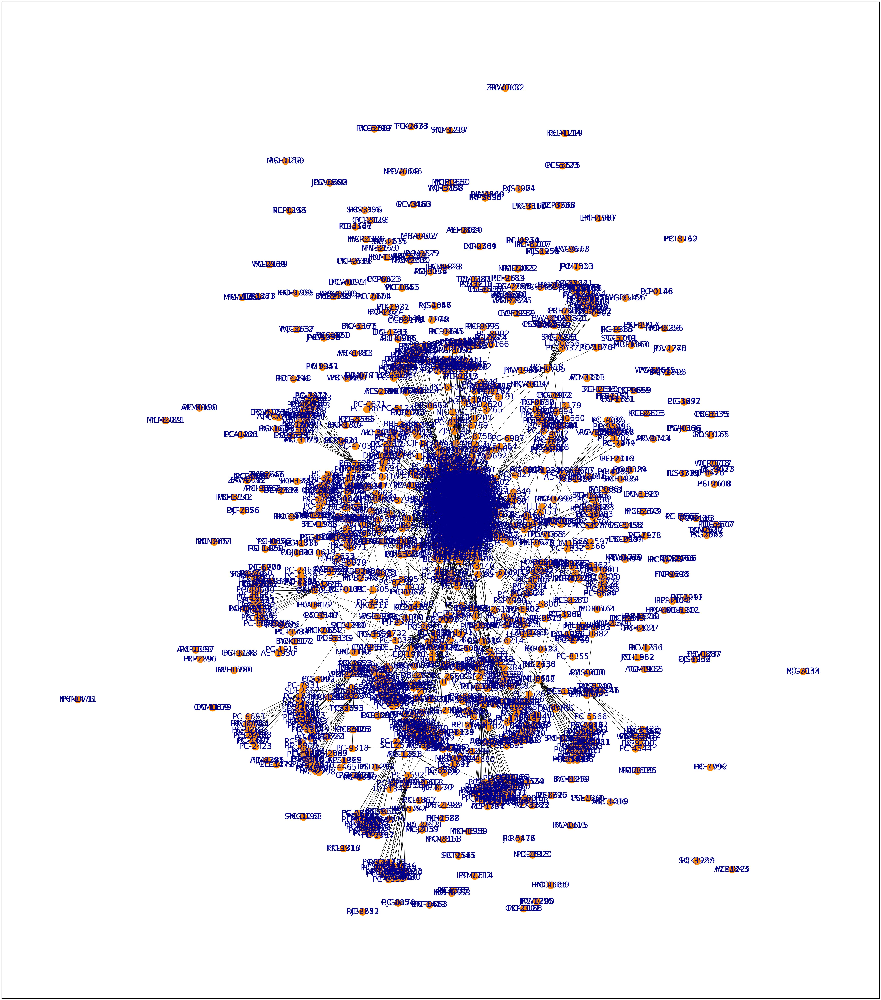

In [40]:
plt.figure(figsize=(70, 80)) 
nx.draw_networkx(graph, node_size = 1000, font_size  = 35, node_color = "darkorange", font_color = "darkblue")
plt.show()

In [41]:
node_degrees = nx.degree(graph)
node_degrees = dict(node_degrees)
type(node_degrees)

dict

In [42]:
node_degrees #The degree of a node is the number of edges connected to the node
user_pc = pd.DataFrame(node_degrees.items(), columns=['user', 'pc_count'])
user_pc
#user_pc.shape

,user,pc_count
0,AAB0162,1
1,AAC0610,1
2,AAC0668,1
3,AAP1919,89
4,AAP1942,1
...,...,...
2141,PC-8447,1
2142,PC-6028,1
2143,PC-6816,1
2144,PC-9160,1


In [43]:
user_pc = user_pc[user_pc.user.isin(logoff.user)]
user_pc

,user,pc_count
0,AAB0162,1
1,AAC0610,1
2,AAC0668,1
3,AAP1919,89
4,AAP1942,1
...,...,...
601,ZHM1979,1
602,ZJS2648,7
603,ZRM0694,135
604,ZSL2618,1


In [44]:
len(logoff['user'].unique())

606

## EDA, Feature Engineering and Stats - Full Logon Dataset

In [45]:
logon_users_tidy.shape

(498657, 5)

In [46]:
#parsing date column to datetime
logon_users_tidy['date'].dtype
logon_users_tidy['date'] = pd.to_datetime(logon_users_tidy['date'])
logon_users_tidy.head()

,id,date,user,pc,activity
0,{J3S1-G0CN29NY-6126GYJV},2010-01-02 06:16:00,ANC1950,PC-4921,Logon
1,{M1V4-S1FK13BQ-2952XBLU},2010-01-02 06:25:00,SAB1954,PC-5091,Logon
2,{S2E1-Y8HO73WG-6712ZKOG},2010-01-02 06:28:00,LIM1718,PC-7539,Logon
3,{R6M2-K5KG74DG-8301KROW},2010-01-02 07:02:00,CGW0692,PC-6774,Logon
4,{U3K5-A6GW94ZN-9634ZUHB},2010-01-02 07:07:00,ZRM0694,PC-6816,Logon


In [47]:
logon_users_tidy['date'].dtype


dtype('<M8[ns]')

In [48]:
# extract the time from date column add and store in a new column
logon_users_tidy['time'] = logon_users_tidy['date'].dt.time
logon_users_tidy.head()

,id,date,user,pc,activity,time
0,{J3S1-G0CN29NY-6126GYJV},2010-01-02 06:16:00,ANC1950,PC-4921,Logon,06:16:00
1,{M1V4-S1FK13BQ-2952XBLU},2010-01-02 06:25:00,SAB1954,PC-5091,Logon,06:25:00
2,{S2E1-Y8HO73WG-6712ZKOG},2010-01-02 06:28:00,LIM1718,PC-7539,Logon,06:28:00
3,{R6M2-K5KG74DG-8301KROW},2010-01-02 07:02:00,CGW0692,PC-6774,Logon,07:02:00
4,{U3K5-A6GW94ZN-9634ZUHB},2010-01-02 07:07:00,ZRM0694,PC-6816,Logon,07:07:00


In [49]:
logon_users_tidy['time'].dtype

dtype('O')

### Subsetting all records for 'Logon' activity


In [50]:
user_logon = logon_users_tidy.loc[logon_users_tidy['activity'] == 'Logon']
user_logon.head()

,id,date,user,pc,activity,time
0,{J3S1-G0CN29NY-6126GYJV},2010-01-02 06:16:00,ANC1950,PC-4921,Logon,06:16:00
1,{M1V4-S1FK13BQ-2952XBLU},2010-01-02 06:25:00,SAB1954,PC-5091,Logon,06:25:00
2,{S2E1-Y8HO73WG-6712ZKOG},2010-01-02 06:28:00,LIM1718,PC-7539,Logon,06:28:00
3,{R6M2-K5KG74DG-8301KROW},2010-01-02 07:02:00,CGW0692,PC-6774,Logon,07:02:00
4,{U3K5-A6GW94ZN-9634ZUHB},2010-01-02 07:07:00,ZRM0694,PC-6816,Logon,07:07:00


In [51]:
user_logon['date'].dtype

dtype('<M8[ns]')

In [52]:
# add another column 'hour' for calculating mean Logon time 
# time column is an object type and cannot be used for calculating mean
user_logon['hour'] = pd.to_datetime(user_logon['date'], format='%H:%M').dt.hour
user_logon.head()

/tmp/ipykernel_34/3067985409.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_logon['hour'] = pd.to_datetime(user_logon['date'], format='%H:%M').dt.hour


,id,date,user,pc,activity,time,hour
0,{J3S1-G0CN29NY-6126GYJV},2010-01-02 06:16:00,ANC1950,PC-4921,Logon,06:16:00,6
1,{M1V4-S1FK13BQ-2952XBLU},2010-01-02 06:25:00,SAB1954,PC-5091,Logon,06:25:00,6
2,{S2E1-Y8HO73WG-6712ZKOG},2010-01-02 06:28:00,LIM1718,PC-7539,Logon,06:28:00,6
3,{R6M2-K5KG74DG-8301KROW},2010-01-02 07:02:00,CGW0692,PC-6774,Logon,07:02:00,7
4,{U3K5-A6GW94ZN-9634ZUHB},2010-01-02 07:07:00,ZRM0694,PC-6816,Logon,07:07:00,7


In [53]:
# min and max login time of each user
#user_logon_stats_1 = user_logon.groupby
user_logon_stats = user_logon.groupby('user')['time'].agg([min, max]).reset_index()

#user_logon_stats
user_logon_stats.describe()
#user_logon_stats_1.describe()

/tmp/ipykernel_34/3539139817.py:3: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  user_logon_stats = user_logon.groupby('user')['time'].agg([min, max]).reset_index()
/tmp/ipykernel_34/3539139817.py:3: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  user_logon_stats = user_logon.groupby('user')['time'].agg([min, max]).reset_index()


,user,min,max
count,606,606,606
unique,606,69,390
top,ZVB2656,07:45:00,08:03:00
freq,1,251,14


In [54]:
#mode login time for each user
pd.set_option('display.max_rows', None)
user_logon.groupby('user')['time'].agg(pd.Series.mode).reset_index() ## some records are multi-modal
pd.set_option('display.max_rows', 5)


# To handle the multi-modal situation
## value_counts arranged in descending order so you want to grab the index of the first row
pd.set_option('display.max_rows', None)
logon_mode = user_logon.groupby('user')['time'].agg(lambda x: x.value_counts().index[0]).reset_index()
pd.set_option('display.max_rows', 10)
logon_mode

,user,time
0,AAB0162,07:45:00
1,AAC0610,08:00:00
2,AAC0668,08:01:00
3,AAP1919,07:45:00
4,AAP1942,07:45:00
...,...,...
601,ZHM1979,09:30:00
602,ZJS2648,08:02:00
603,ZRM0694,07:15:00
604,ZSL2618,09:24:00


In [55]:
# calculate average (mean) logon time for each user
logon_mean = user_logon.groupby('user')['hour'].mean().reset_index()
logon_mean['hour'].dtype
logon_mean['hour'] = pd.to_datetime(logon_mean['hour'], format='%H').dt.time
logon_mean.head()


,user,hour
0,AAB0162,07:00:00
1,AAC0610,09:00:00
2,AAC0668,07:00:00
3,AAP1919,07:00:00
4,AAP1942,09:00:00


In [56]:
# Adding mode and mean data to user_logon_stats
user_logon_stats['mode'] = logon_mode['time']
user_logon_stats['mean'] = logon_mean['hour']
user_logon_stats.head()


,user,min,max,mode,mean
0,AAB0162,07:30:00,08:07:00,07:45:00,07:00:00
1,AAC0610,00:09:47,23:56:14,08:00:00,09:00:00
2,AAC0668,07:45:00,08:29:00,08:01:00,07:00:00
3,AAP1919,07:30:00,16:33:14,07:45:00,07:00:00
4,AAP1942,07:30:00,13:40:33,07:45:00,09:00:00


###  Subsetting all records for 'Logoff' activity


In [57]:
user_logoff = logon_users_tidy.loc[logon_users_tidy['activity'] == 'Logoff']
user_logoff.head()

,id,date,user,pc,activity,time
29,{B0K2-U3AE03MR-8105GFVY},2010-01-02 11:02:44,ZRM0694,PC-2539,Logoff,11:02:44
42,{W4J3-H5LA49UO-7831PZEQ},2010-01-02 15:22:00,CGW0692,PC-6774,Logoff,15:22:00
43,{P4W3-X5UQ46WI-5115FPBP},2010-01-02 15:24:00,ZRM0694,PC-6816,Logoff,15:24:00
44,{O6S7-L5JX28BP-8070KYRJ},2010-01-02 15:39:00,DAR0709,PC-4052,Logoff,15:39:00
45,{Z6E4-T4IR60SV-6879DDTQ},2010-01-02 16:00:00,KJS1940,PC-3182,Logoff,16:00:00


In [58]:
user_logoff.shape

(222086, 6)

In [59]:
# add another column 'hour' for calculating mean Logoff time 
# time column is an object type and cannot be used for calculating mean
user_logoff['hour'] = pd.to_datetime(user_logoff['date'], format='%H:%M').dt.hour
user_logoff.head()

/tmp/ipykernel_34/1361109948.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  user_logoff['hour'] = pd.to_datetime(user_logoff['date'], format='%H:%M').dt.hour


,id,date,user,pc,activity,time,hour
29,{B0K2-U3AE03MR-8105GFVY},2010-01-02 11:02:44,ZRM0694,PC-2539,Logoff,11:02:44,11
42,{W4J3-H5LA49UO-7831PZEQ},2010-01-02 15:22:00,CGW0692,PC-6774,Logoff,15:22:00,15
43,{P4W3-X5UQ46WI-5115FPBP},2010-01-02 15:24:00,ZRM0694,PC-6816,Logoff,15:24:00,15
44,{O6S7-L5JX28BP-8070KYRJ},2010-01-02 15:39:00,DAR0709,PC-4052,Logoff,15:39:00,15
45,{Z6E4-T4IR60SV-6879DDTQ},2010-01-02 16:00:00,KJS1940,PC-3182,Logoff,16:00:00,16


In [60]:
# min and max logoff time of each user
user_logoff_stats = user_logoff.groupby('user')['time'].agg([min, max]).reset_index()
user_logoff_stats

/tmp/ipykernel_34/2928781610.py:2: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  user_logoff_stats = user_logoff.groupby('user')['time'].agg([min, max]).reset_index()
/tmp/ipykernel_34/2928781610.py:2: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  user_logoff_stats = user_logoff.groupby('user')['time'].agg([min, max]).reset_index()


,user,min,max
0,AAB0162,18:20:00,19:00:00
1,AAC0610,00:20:27,17:15:00
2,AAC0668,16:35:00,17:15:00
3,AAP1919,08:00:07,17:00:00
4,AAP1942,15:45:00,16:00:00
...,...,...,...
601,ZHM1979,17:03:00,17:45:00
602,ZJS2648,00:36:50,23:25:44
603,ZRM0694,00:00:13,23:54:47
604,ZSL2618,18:17:00,18:45:00


In [61]:
#mode logoff time for each user
pd.set_option('display.max_rows', None)
user_logoff.groupby('user')['time'].agg(pd.Series.mode).reset_index()
pd.set_option('display.max_rows', 5)


# To handle the multi-modal situation
## value_counts arranged in descending order so you want to grab the index of the first row
logoff_mode = user_logoff.groupby('user')['time'].agg(lambda x: x.value_counts().index[0]).reset_index()
logoff_mode.head()

,user,time
0,AAB0162,18:45:00
1,AAC0610,17:00:00
2,AAC0668,17:00:00
3,AAP1919,16:55:00
4,AAP1942,15:45:00


In [62]:
# Calculate mean logff
logoff_mean = user_logoff.groupby('user')['hour'].mean().reset_index()
logoff_mean['hour'] = logoff_mean['hour'].astype(int)
logoff_mean['hour'] = pd.to_datetime(logoff_mean['hour'], format='%H').dt.time
logoff_mean.head()

,user,hour
0,AAB0162,18:00:00
1,AAC0610,15:00:00
2,AAC0668,16:00:00
3,AAP1919,15:00:00
4,AAP1942,15:00:00


In [63]:
# Adding mode and mean data to user_logoff_stats
user_logoff_stats['mode'] = logoff_mode['time']
user_logoff_stats['mean'] = logoff_mean['hour']

In [64]:
user_logoff_stats.head()

,user,min,max,mode,mean
0,AAB0162,18:20:00,19:00:00,18:45:00,18:00:00
1,AAC0610,00:20:27,17:15:00,17:00:00,15:00:00
2,AAC0668,16:35:00,17:15:00,17:00:00,16:00:00
3,AAP1919,08:00:07,17:00:00,16:55:00,15:00:00
4,AAP1942,15:45:00,16:00:00,15:45:00,15:00:00


## EDA, Feature Engineering and Stats - Device dataset

In [65]:
device_users_tidy

,id,date,user,pc,activity
0,{W0H4-S5OD03FD-5666ODRE},01/02/2010 07:48:30,ANC1950,PC-4921,Connect
1,{G7P6-Q6CY11UE-5306WORA},01/02/2010 07:55:26,ANC1950,PC-4921,Disconnect
...,...,...,...,...,...
216337,{K2Q9-H2CR79AX-2190JEQZ},05/31/2011 18:15:53,HGJ2592,PC-4177,Disconnect
216338,{F0N6-L3PH08TP-5802GYXP},05/31/2011 18:18:06,XAB0627,PC-2560,Disconnect


In [66]:
device_users_tidy['date'].dtype

# extract time from date column and mutate a new column
device_users_tidy['time'] = pd.to_datetime(device_users_tidy['date']).dt.time
device_users_tidy.head()

,id,date,user,pc,activity,time
0,{W0H4-S5OD03FD-5666ODRE},01/02/2010 07:48:30,ANC1950,PC-4921,Connect,07:48:30
1,{G7P6-Q6CY11UE-5306WORA},01/02/2010 07:55:26,ANC1950,PC-4921,Disconnect,07:55:26
2,{I6Q1-T0DD41UO-9348UEFB},01/02/2010 08:21:16,LAN1329,PC-8190,Connect,08:21:16
3,{Z9V2-W4LA93SX-8027EVBN},01/02/2010 08:30:44,LAN1329,PC-8190,Disconnect,08:30:44
4,{S3B1-O6PF65TB-9382ERTG},01/02/2010 08:32:15,QAH1315,PC-3767,Connect,08:32:15


In [67]:
device_users_tidy['time'].dtype

dtype('O')

In [68]:
# Subset records of Connect & Diconnect activities
device_conn = device_users_tidy.loc[device_users_tidy['activity'] == 'Connect']
device_disconn = device_users_tidy.loc[device_users_tidy['activity'] == 'Disconnect']

In [69]:
print(device_conn.shape)
print(device_disconn.shape)

(108526, 6)
(107813, 6)


### Device Records == 'Connect' 

In [70]:
device_conn.head()

,id,date,user,pc,activity,time
0,{W0H4-S5OD03FD-5666ODRE},01/02/2010 07:48:30,ANC1950,PC-4921,Connect,07:48:30
2,{I6Q1-T0DD41UO-9348UEFB},01/02/2010 08:21:16,LAN1329,PC-8190,Connect,08:21:16
4,{S3B1-O6PF65TB-9382ERTG},01/02/2010 08:32:15,QAH1315,PC-3767,Connect,08:32:15
6,{E4B2-M4HB39QA-2402GUPA},01/02/2010 09:02:07,QAH1315,PC-3767,Connect,09:02:07
7,{K1K2-F0BS97OS-2113CREM},01/02/2010 09:03:14,LAN1329,PC-8190,Connect,09:03:14


In [71]:
# min max time for connect for each user
device_conn_stats = device_conn.groupby('user')['time'].agg([min, max]).reset_index()
device_conn_stats.head()

/tmp/ipykernel_34/692612824.py:2: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  device_conn_stats = device_conn.groupby('user')['time'].agg([min, max]).reset_index()
/tmp/ipykernel_34/692612824.py:2: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  device_conn_stats = device_conn.groupby('user')['time'].agg([min, max]).reset_index()


,user,min,max
0,AAC0610,07:53:09,20:40:06
1,AAP1919,07:33:31,16:51:25
2,ACB0701,07:16:50,15:30:21
3,ACS1921,07:36:47,16:52:06
4,ACV1946,07:37:19,22:08:01


In [72]:
device_conn_stats_1 = device_conn.groupby('user')
device_conn_stats_1.describe()

id                                        date         \
        count unique                       top freq count unique   
user                                                               
AAC0610   351    351  {L9P0-Q7KV71RC-5122GESV}    1   351    351   
AAP1919  3089   3089  {W8A0-Q3RR74CW-2011GPLU}    1  3089   3089   
...       ...    ...                       ...  ...   ...    ...   
ZHF1006  2811   2811  {K8I4-B5HB74KX-6227AMDI}    1  2811   2811   
ZRM0694   217    217  {M3L5-O5KM64DX-5994OVIG}    1   217    217   

                                     pc                       activity         \
                         top freq count unique      top  freq    count unique   
user                                                                            
AAC0610  05/27/2011 16:36:27    1   351      1  PC-1834   351      351      1   
AAP1919  05/31/2011 15:17:46    1  3089      1  PC-5958  3089     3089      1   
...                      ...  ...   ...    ...      ...   ...      ...    ...   
ZHF1006  05/31/2011 16:08:27    1  2811      1  PC-8447  2811     2811      1   
ZRM0694  05/29/2011 12:58:49    1   217      1  PC-6816   217      217      1   

                        time                        
             top  freq count unique       top freq  
user                                                
AAC0610  Connect   351   351    351  16:36:27    1  
AAP1919  Connect  3089  3089   2961  10:54:39    3  
...          ...   ...   ...    ...       ...  ...  
ZHF1006  Connect  2811  2811   2703  11:07:43    3  
ZRM0694  Connect   217   217    217  12:58:49    1  

[121 rows x 20 columns]

In [73]:
conn_mode = device_conn.groupby('user')['time'].agg(lambda x: x.value_counts().index[0]).reset_index()
pd.set_option('display.max_rows', 10)
conn_mode
#conn_mode.shape

,user,time
0,AAC0610,16:36:27
1,AAP1919,10:54:39
2,ACB0701,13:51:58
3,ACS1921,15:10:15
4,ACV1946,14:41:26
...,...,...
116,XAB0627,16:49:54
117,XIW0171,13:12:56
118,YDM1720,16:06:27
119,ZHF1006,11:07:43


In [74]:
# Add extract hour and add a new column to device_conn in order to calculate average 'connect' time
device_conn['hour'] = pd.to_datetime(device_conn['date']).dt.hour

/tmp/ipykernel_34/2070478208.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  device_conn['hour'] = pd.to_datetime(device_conn['date']).dt.hour


In [75]:
device_conn.head()

,id,date,user,pc,activity,time,hour
0,{W0H4-S5OD03FD-5666ODRE},01/02/2010 07:48:30,ANC1950,PC-4921,Connect,07:48:30,7
2,{I6Q1-T0DD41UO-9348UEFB},01/02/2010 08:21:16,LAN1329,PC-8190,Connect,08:21:16,8
4,{S3B1-O6PF65TB-9382ERTG},01/02/2010 08:32:15,QAH1315,PC-3767,Connect,08:32:15,8
6,{E4B2-M4HB39QA-2402GUPA},01/02/2010 09:02:07,QAH1315,PC-3767,Connect,09:02:07,9
7,{K1K2-F0BS97OS-2113CREM},01/02/2010 09:03:14,LAN1329,PC-8190,Connect,09:03:14,9


In [76]:
# mean 'connect'
conn_mean = device_conn.groupby('user')['hour'].mean().reset_index()
conn_mean['hour'] = conn_mean['hour'].astype(int)
conn_mean['hour'] = pd.to_datetime(conn_mean['hour'], format='%H').dt.time

conn_mean.head()

,user,hour
0,AAC0610,12:00:00
1,AAP1919,11:00:00
2,ACB0701,10:00:00
3,ACS1921,11:00:00
4,ACV1946,11:00:00


In [77]:
# Add mode and mean to device_conn_stats

device_conn_stats['mode'] = conn_mode['time']
device_conn_stats['mean'] = conn_mean['hour']

In [78]:
device_conn_stats.head()

,user,min,max,mode,mean
0,AAC0610,07:53:09,20:40:06,16:36:27,12:00:00
1,AAP1919,07:33:31,16:51:25,10:54:39,11:00:00
2,ACB0701,07:16:50,15:30:21,13:51:58,10:00:00
3,ACS1921,07:36:47,16:52:06,15:10:15,11:00:00
4,ACV1946,07:37:19,22:08:01,14:41:26,11:00:00


### Device Records == 'Disconnect' 


In [79]:
## Min and Max
device_disconn_stats = device_disconn.groupby('user')['time'].agg([min, max]).reset_index()
device_disconn_stats.head()

/tmp/ipykernel_34/2050205937.py:2: FutureWarning: The provided callable <built-in function min> is currently using SeriesGroupBy.min. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "min" instead.
  device_disconn_stats = device_disconn.groupby('user')['time'].agg([min, max]).reset_index()
/tmp/ipykernel_34/2050205937.py:2: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  device_disconn_stats = device_disconn.groupby('user')['time'].agg([min, max]).reset_index()


,user,min,max
0,AAC0610,08:17:14,20:42:18
1,AAP1919,07:39:19,16:58:37
2,ACB0701,07:44:32,15:39:29
3,ACS1921,07:46:31,16:54:18
4,ACV1946,07:54:08,22:53:37


In [80]:
##correction below
dconn_mode = device_disconn.groupby('user')['time'].agg(lambda x: x.value_counts().index[0]).reset_index()
dconn_mode.head()


,user,time
0,AAC0610,16:29:03
1,AAP1919,09:33:55
2,ACB0701,08:55:55
3,ACS1921,13:20:40
4,ACV1946,11:26:26


In [81]:
device_disconn.head()

,id,date,user,pc,activity,time
1,{G7P6-Q6CY11UE-5306WORA},01/02/2010 07:55:26,ANC1950,PC-4921,Disconnect,07:55:26
3,{Z9V2-W4LA93SX-8027EVBN},01/02/2010 08:30:44,LAN1329,PC-8190,Disconnect,08:30:44
5,{F4E4-Z5ZH53TQ-0592CABZ},01/02/2010 08:48:37,QAH1315,PC-3767,Disconnect,08:48:37
8,{J8Z9-I5FP85HT-6130BPLE},01/02/2010 09:15:15,QAH1315,PC-3767,Disconnect,09:15:15
9,{X3G9-O1CL38SE-5475DEWB},01/02/2010 09:29:39,LAN1329,PC-8190,Disconnect,09:29:39


In [82]:
# Extracting hour and adding hour column to calculate average time in device_disconn
device_disconn['hour'] = pd.to_datetime(device_disconn['date']).dt.hour
device_disconn.head()

/tmp/ipykernel_34/2153017008.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  device_disconn['hour'] = pd.to_datetime(device_disconn['date']).dt.hour


,id,date,user,pc,activity,time,hour
1,{G7P6-Q6CY11UE-5306WORA},01/02/2010 07:55:26,ANC1950,PC-4921,Disconnect,07:55:26,7
3,{Z9V2-W4LA93SX-8027EVBN},01/02/2010 08:30:44,LAN1329,PC-8190,Disconnect,08:30:44,8
5,{F4E4-Z5ZH53TQ-0592CABZ},01/02/2010 08:48:37,QAH1315,PC-3767,Disconnect,08:48:37,8
8,{J8Z9-I5FP85HT-6130BPLE},01/02/2010 09:15:15,QAH1315,PC-3767,Disconnect,09:15:15,9
9,{X3G9-O1CL38SE-5475DEWB},01/02/2010 09:29:39,LAN1329,PC-8190,Disconnect,09:29:39,9


In [83]:
dconn_mean = device_disconn.groupby('user')['hour'].mean().reset_index()
dconn_mean['hour'] = dconn_mean['hour'].astype(int)
dconn_mean['hour'] = pd.to_datetime(dconn_mean['hour'], format='%H').dt.time
dconn_mean.head()

,user,hour
0,AAC0610,12:00:00
1,AAP1919,11:00:00
2,ACB0701,11:00:00
3,ACS1921,11:00:00
4,ACV1946,11:00:00


In [84]:
# Adding mode and mean to device_disconn_stats

device_disconn_stats['mode'] = dconn_mode['time']
device_disconn_stats['mean'] = dconn_mean['hour']

In [85]:
device_disconn_stats.head()

,user,min,max,mode,mean
0,AAC0610,08:17:14,20:42:18,16:29:03,12:00:00
1,AAP1919,07:39:19,16:58:37,09:33:55,11:00:00
2,ACB0701,07:44:32,15:39:29,08:55:55,11:00:00
3,ACS1921,07:46:31,16:54:18,13:20:40,11:00:00
4,ACV1946,07:54:08,22:53:37,11:26:26,11:00:00


## EDA, Feature Engineering and Stats - File dataset

In [86]:
file_users_tidy

,id,date,user,pc,filename,content
0,{G6V4-X4OO50BW-3929DZJE},01/02/2010 07:48:32,ANC1950,PC-4921,R:\26v1D25\DK7Y5BP6.doc,D0-CF-11-E0-A1-B1-1A-E1 Much as Sir Phillip pa...
1,{V8D4-P5YV83AT-7619XAGB},01/02/2010 07:48:42,ANC1950,PC-4921,C:\ANC1950\AIG3BQT7.pdf,25-50-44-46-2D The show retained a similar tim...
2,{H6J3-G9MS37AS-5194HLHH},01/02/2010 07:48:55,ANC1950,PC-4921,R:\53tdGl0\WRB6GQ5E.doc,D0-CF-11-E0-A1-B1-1A-E1 Krafft-Ebing believed ...
3,{D1H1-Y0FG77FW-4804WHXJ},01/02/2010 07:49:21,ANC1950,PC-4921,R:\53tdGl0\T8EHA7HS.doc,D0-CF-11-E0-A1-B1-1A-E1 Hall uses the mark of ...
4,{W1E5-N2KV01NR-8204BDPR},01/02/2010 07:50:14,ANC1950,PC-4921,R:\53tdGl0\KKNYBAXM.pdf,25-50-44-46-2D Persuaded that she cannot give ...
...,...,...,...,...,...,...
287427,{F4U6-W4OZ53BO-0103WMOZ},05/31/2011 18:15:19,HGJ2592,PC-4177,R:\832yJ59\W3P97PG9.txt,"50-47-53-55 Wickson later stated that, ""I had ..."
287428,{Q1B6-D8AI08VD-3067DGFA},05/31/2011 18:15:21,HGJ2592,PC-4177,C:\243DF29\701BJZJ2.doc,D0-CF-11-E0-A1-B1-1A-E1 It came close to being...
287429,{S3H6-Z7ZP76ZH-6213KEZI},05/31/2011 18:15:24,HGJ2592,PC-4177,R:\HGJ2592\S81FAI74.doc,D0-CF-11-E0-A1-B1-1A-E1 The TAOR frequency tha...
287430,{A8B1-Q2VO08GN-4803VDJI},05/31/2011 18:15:25,HGJ2592,PC-4177,R:\77cD9m2\S81FAI74.doc,D0-CF-11-E0-A1-B1-1A-E1 Wang was tried on thre...


In [87]:
file_users_tidy.shape


(287432, 6)

In [88]:
# Extract date (day) and add a new column to calculate max and mode files copy pey day for each user
# Each user has a normal number of files copy per day

file_users_tidy['date2'] = pd.to_datetime(file_users_tidy['date']).dt.date

In [89]:
file_users_tidy

,id,date,user,pc,filename,content,date2
0,{G6V4-X4OO50BW-3929DZJE},01/02/2010 07:48:32,ANC1950,PC-4921,R:\26v1D25\DK7Y5BP6.doc,D0-CF-11-E0-A1-B1-1A-E1 Much as Sir Phillip pa...,2010-01-02
1,{V8D4-P5YV83AT-7619XAGB},01/02/2010 07:48:42,ANC1950,PC-4921,C:\ANC1950\AIG3BQT7.pdf,25-50-44-46-2D The show retained a similar tim...,2010-01-02
2,{H6J3-G9MS37AS-5194HLHH},01/02/2010 07:48:55,ANC1950,PC-4921,R:\53tdGl0\WRB6GQ5E.doc,D0-CF-11-E0-A1-B1-1A-E1 Krafft-Ebing believed ...,2010-01-02
3,{D1H1-Y0FG77FW-4804WHXJ},01/02/2010 07:49:21,ANC1950,PC-4921,R:\53tdGl0\T8EHA7HS.doc,D0-CF-11-E0-A1-B1-1A-E1 Hall uses the mark of ...,2010-01-02
4,{W1E5-N2KV01NR-8204BDPR},01/02/2010 07:50:14,ANC1950,PC-4921,R:\53tdGl0\KKNYBAXM.pdf,25-50-44-46-2D Persuaded that she cannot give ...,2010-01-02
...,...,...,...,...,...,...,...
287427,{F4U6-W4OZ53BO-0103WMOZ},05/31/2011 18:15:19,HGJ2592,PC-4177,R:\832yJ59\W3P97PG9.txt,"50-47-53-55 Wickson later stated that, ""I had ...",2011-05-31
287428,{Q1B6-D8AI08VD-3067DGFA},05/31/2011 18:15:21,HGJ2592,PC-4177,C:\243DF29\701BJZJ2.doc,D0-CF-11-E0-A1-B1-1A-E1 It came close to being...,2011-05-31
287429,{S3H6-Z7ZP76ZH-6213KEZI},05/31/2011 18:15:24,HGJ2592,PC-4177,R:\HGJ2592\S81FAI74.doc,D0-CF-11-E0-A1-B1-1A-E1 The TAOR frequency tha...,2011-05-31
287430,{A8B1-Q2VO08GN-4803VDJI},05/31/2011 18:15:25,HGJ2592,PC-4177,R:\77cD9m2\S81FAI74.doc,D0-CF-11-E0-A1-B1-1A-E1 Wang was tried on thre...,2011-05-31


In [90]:
# to figure out the number of files transfered by a single user per day
files_per_day = file_users_tidy.groupby(['user', 'date2']).size().reset_index()
files_per_day.head()

,user,date2,0
0,AAB0162,2010-01-13,2
1,AAB0162,2010-01-18,1
2,AAB0162,2010-03-08,1
3,AAB0162,2010-05-19,1
4,AAB0162,2010-05-24,1


In [91]:
files_per_day.rename(columns={0:'transfers_per_day'}, inplace=True)
files_per_day

,user,date2,transfers_per_day
0,AAB0162,2010-01-13,2
1,AAB0162,2010-01-18,1
2,AAB0162,2010-03-08,1
3,AAB0162,2010-05-19,1
4,AAB0162,2010-05-24,1
...,...,...,...
46510,ZSL2618,2010-03-26,1
46511,ZSL2618,2010-04-08,1
46512,ZSL2618,2010-04-15,1
46513,ZSL2618,2010-04-22,1


In [92]:
# Max file transfers per day
files_max_per_day = files_per_day.groupby('user')['transfers_per_day'].agg(max).reset_index()
files_max_per_day.rename(columns={'transfers_per_day': "max_transfers_per_user"}, inplace=True)
files_max_per_day.head()

/tmp/ipykernel_34/3805250517.py:2: FutureWarning: The provided callable <built-in function max> is currently using SeriesGroupBy.max. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "max" instead.
  files_max_per_day = files_per_day.groupby('user')['transfers_per_day'].agg(max).reset_index()


,user,max_transfers_per_user
0,AAB0162,2
1,AAC0610,18
2,AAC0668,5
3,AAP1919,10
4,AAP1942,2


In [93]:
##problem of multi-modal records
##to handle multi modal records, we do the following
files_mode_per_day = files_per_day.groupby('user')['transfers_per_day'].agg(lambda x: x.value_counts().index[0]).reset_index()
files_mode_per_day.rename(columns={'transfers_per_day': "mode_transfers_per_user"}, inplace=True)

files_mode_per_day.head()

,user,mode_transfers_per_user
0,AAB0162,1
1,AAC0610,7
2,AAC0668,1
3,AAP1919,1
4,AAP1942,1


In [94]:
# file copy stats for each user

files_stats = files_mode_per_day
files_stats.rename(columns={files_stats.columns[1]:'mode_transfers_per_user'}, inplace=True)
files_stats

,user,mode_transfers_per_user
0,AAB0162,1
1,AAC0610,7
2,AAC0668,1
3,AAP1919,1
4,AAP1942,1
...,...,...
484,ZHF1006,27
485,ZHM1979,1
486,ZJS2648,1
487,ZRM0694,1


In [95]:
file_stats_new = pd.DataFrame()
file_stats_new['user'] = files_stats["user"]
file_stats_new["mode_transfers_per_user"] = files_stats["mode_transfers_per_user"]
file_stats_new["max_transfers_per_user"] = files_max_per_day["max_transfers_per_user"]
file_stats_new

,user,mode_transfers_per_user,max_transfers_per_user
0,AAB0162,1,2
1,AAC0610,7,18
2,AAC0668,1,5
3,AAP1919,1,10
4,AAP1942,1,2
...,...,...,...
484,ZHF1006,27,29
485,ZHM1979,1,6
486,ZJS2648,1,2
487,ZRM0694,1,10


In [96]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.ensemble import IsolationForest

# Insider Threat Detection  
  
## Anomaly Detection using Isolated Forests

In [97]:
print(user_pc)

        user  pc_count
0    AAB0162         1
1    AAC0610         1
2    AAC0668         1
3    AAP1919        89
4    AAP1942         1
..       ...       ...
601  ZHM1979         1
602  ZJS2648         7
603  ZRM0694       135
604  ZSL2618         1
605  ZVB2656         1

[606 rows x 2 columns]


In [98]:
user_pc_count = np.array(user_pc['pc_count'])
user_pc_count

array([  1,   1,   1,  89,   1,   1,   1,   1,  17,   1,  94,  85,  17,
        84,   1,   1,   1, 108,   1,   1,   1,   1,  32,  61,   1,   1,
         1,   1,   1,   1,   1,   1,   1,   1,   1,   1, 112,   1,   1,
         1,   1,   1,   1,   1, 108,   1,   1,  93,   1,   1,   1,   1,
         1,  81,  55,   1,  49,   1,   1,   1,  99,   1,  80,   1,   1,
         1,   1,   1,  31,   1,   1,   1,   1,  24,   1,   1,   1,   1,
        21,   3,   1,   1,   1,  75, 104,   1,   1,   1,   1,   1,   1,
        77,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,   1,  10,
         1,  31,   1,  16,  27,   1,   1,   5,   1,   1,   1,   1,   1,
         1,  28,  17,  24,   1,   1,   1,   1,  47,   1,  17,   1,   1,
         1,   1,   1,  13,   1,  89,   1,   1,   1,   1,  22,   1,   1,
         1,   1,  37,   1,   1,   1, 108,   1,   1,  17,   1,   1,   1,
         1,   1,   1,  22,   1,  66,   1,  65,  92,   1,   1,  68,   1,
       114,  26,  58,   1,   1,   1,   1,   1,   1,   1,   1,  8

In [99]:
user_pc_ct = user_pc_count.reshape(-1,1)
#Now trying to reshape with (-1, 1) . We have provided column as 1 but rows as unknown

#user_pc_ct

### Modeling user_pc relationship using Isolation Forests

In [100]:
forest = IsolationForest(bootstrap=False, contamination=0.1, max_features=1.0,
        max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
        verbose=0)
forest.fit(user_pc_ct)


IsolationForest(contamination=0.1, n_jobs=1)

In [101]:
graph_a_score = forest.decision_function(user_pc_ct)
#graph_a_score
print(graph_a_score[1:10])


[0.22194458 0.22194458 0.00681166 0.22194458 0.22194458 0.22194458
 0.22194458 0.04680153 0.22194458]


In [102]:
graph_result = pd.DataFrame()
graph_result['user'] = user_pc['user']
graph_result['ascore'] = graph_a_score
graph_result

,user,ascore
0,AAB0162,0.221945
1,AAC0610,0.221945
2,AAC0668,0.221945
3,AAP1919,0.006812
4,AAP1942,0.221945
...,...,...
601,ZHM1979,0.221945
602,ZJS2648,-0.019617
603,ZRM0694,-0.177895
604,ZSL2618,0.221945


In [103]:
outliers = graph_result.loc[graph_result['ascore'] < 0] # OUTLIERS
outliers


,user,ascore
10,ACS1921,-0.012088
23,AHC1994,-0.001554
36,AKL1305,-0.043249
47,ANO2653,-0.009106
54,ASW1918,-0.008231
...,...,...
591,XIW0171,-0.005961
595,YDM1720,-0.009739
600,ZHF1006,-0.012525
602,ZJS2648,-0.019617


### Anomaly detection for log on/log off using Isolation Forests

### Log on

In [104]:
user_logon_stats.head()

,user,min,max,mode,mean
0,AAB0162,07:30:00,08:07:00,07:45:00,07:00:00
1,AAC0610,00:09:47,23:56:14,08:00:00,09:00:00
2,AAC0668,07:45:00,08:29:00,08:01:00,07:00:00
3,AAP1919,07:30:00,16:33:14,07:45:00,07:00:00
4,AAP1942,07:30:00,13:40:33,07:45:00,09:00:00


In [105]:
user_logon_stats['min'].dtype


dtype('O')

In [106]:
user_logon_stats['min'][1].hour


0

In [107]:
## sklearn algorithms do not take dates as input parameters. 
## hence need to convert the time object into numerical values. 
# Function to convert datetime 'time' to time in seconds

def dtt2timestamp(dtt):
    ts = (dtt.hour * 60 + dtt.minute) * 60 + dtt.second
    return ts

In [108]:
user_logon_stats_sec = user_logon_stats

In [109]:
min_ts = [dtt2timestamp(dtt) for dtt in user_logon_stats_sec['min']] 
max_ts = [dtt2timestamp(dtt) for dtt in user_logon_stats_sec['max']]
mode_ts = [dtt2timestamp(dtt) for dtt in user_logon_stats_sec['mode']]
mean_ts = [dtt2timestamp(dtt) for dtt in user_logon_stats_sec['mean']]



In [110]:
user_logon_stats_sec['min_ts'] = min_ts
user_logon_stats_sec['max_ts'] = max_ts
user_logon_stats_sec['mode_ts'] = mode_ts
user_logon_stats_sec['mean_ts'] = mean_ts

In [111]:
user_logon_stats_sec.drop(['min', 'max','mode','mean'], axis=1)

,user,min_ts,max_ts,mode_ts,mean_ts
0,AAB0162,27000,29220,27900,25200
1,AAC0610,587,86174,28800,32400
2,AAC0668,27900,30540,28860,25200
3,AAP1919,27000,59594,27900,25200
4,AAP1942,27000,49233,27900,32400
...,...,...,...,...,...
601,ZHM1979,33300,35820,34200,32400
602,ZJS2648,5050,86040,28920,32400
603,ZRM0694,1011,86027,26100,32400
604,ZSL2618,33300,34980,33840,32400


### Log off

In [112]:
user_logoff_stats.head()

,user,min,max,mode,mean
0,AAB0162,18:20:00,19:00:00,18:45:00,18:00:00
1,AAC0610,00:20:27,17:15:00,17:00:00,15:00:00
2,AAC0668,16:35:00,17:15:00,17:00:00,16:00:00
3,AAP1919,08:00:07,17:00:00,16:55:00,15:00:00
4,AAP1942,15:45:00,16:00:00,15:45:00,15:00:00


In [113]:
user_logoff_stats['min'][1].hour


0

In [114]:
user_logoff_stats_sec = user_logoff_stats

In [115]:
min_ts = [dtt2timestamp(dtt) for dtt in user_logoff_stats_sec['min']] 
max_ts = [dtt2timestamp(dtt) for dtt in user_logoff_stats_sec['max']]
mode_ts = [dtt2timestamp(dtt) for dtt in user_logoff_stats_sec['mode']]
mean_ts = [dtt2timestamp(dtt) for dtt in user_logoff_stats_sec['mean']]

In [116]:
user_logoff_stats_sec['min_ts'] = min_ts
user_logoff_stats_sec['max_ts'] = max_ts
user_logoff_stats_sec['mode_ts'] = mode_ts
user_logoff_stats_sec['mean_ts'] = mean_ts

In [117]:
user_logoff_stats_sec.drop(['min', 'max','mode','mean'], axis=1)

,user,min_ts,max_ts,mode_ts,mean_ts
0,AAB0162,66000,68400,67500,64800
1,AAC0610,1227,62100,61200,54000
2,AAC0668,59700,62100,61200,57600
3,AAP1919,28807,61200,60900,54000
4,AAP1942,56700,57600,56700,54000
...,...,...,...,...,...
601,ZHM1979,61380,63900,63000,61200
602,ZJS2648,2210,84344,61200,50400
603,ZRM0694,13,86087,54900,46800
604,ZSL2618,65820,67500,66960,64800


In [118]:
# combined logon/logoff data for IForest input

log_on_off_stats = pd.DataFrame()

log_on_off_stats['user'] = user_logon_stats_sec['user']

log_on_off_stats['on_min_ts'] = user_logon_stats['min_ts']
log_on_off_stats['on_max_ts'] = user_logon_stats['max_ts']
log_on_off_stats['on_mode_ts'] = user_logon_stats['mode_ts']
log_on_off_stats['on_mean_ts'] = user_logon_stats['mean_ts']

log_on_off_stats['off_min_ts'] = user_logoff_stats['min_ts']
log_on_off_stats['off_max_ts'] = user_logoff_stats['max_ts']
log_on_off_stats['off_mode_ts'] = user_logoff_stats['mode_ts']
log_on_off_stats['off_mean_ts'] = user_logoff_stats['mean_ts']

log_on_off_stats

,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts
0,AAB0162,27000,29220,27900,25200,66000,68400,67500,64800
1,AAC0610,587,86174,28800,32400,1227,62100,61200,54000
2,AAC0668,27900,30540,28860,25200,59700,62100,61200,57600
3,AAP1919,27000,59594,27900,25200,28807,61200,60900,54000
4,AAP1942,27000,49233,27900,32400,56700,57600,56700,54000
...,...,...,...,...,...,...,...,...,...
601,ZHM1979,33300,35820,34200,32400,61380,63900,63000,61200
602,ZJS2648,5050,86040,28920,32400,2210,84344,61200,50400
603,ZRM0694,1011,86027,26100,32400,13,86087,54900,46800
604,ZSL2618,33300,34980,33840,32400,65820,67500,66960,64800


### Modeling logon/logoff relationship using Isolation Forests

In [119]:
# input array
log_stats = log_on_off_stats.drop(['user'], axis = 1)
log_stats_matrix = np.matrix(log_stats)
log_stats_matrix

matrix([[27000, 29220, 27900, ..., 68400, 67500, 64800],
        [  587, 86174, 28800, ..., 62100, 61200, 54000],
        [27900, 30540, 28860, ..., 62100, 61200, 57600],
        ...,
        [ 1011, 86027, 26100, ..., 86087, 54900, 46800],
        [33300, 34980, 33840, ..., 67500, 66960, 64800],
        [27900, 29400, 28800, ..., 62100, 61200, 57600]])

In [123]:
log_stats_array = np.array(log_stats)
log_stats_array

array([[27000, 29220, 27900, ..., 68400, 67500, 64800],
       [  587, 86174, 28800, ..., 62100, 61200, 54000],
       [27900, 30540, 28860, ..., 62100, 61200, 57600],
       ...,
       [ 1011, 86027, 26100, ..., 86087, 54900, 46800],
       [33300, 34980, 33840, ..., 67500, 66960, 64800],
       [27900, 29400, 28800, ..., 62100, 61200, 57600]])

In [125]:
log_stats_matrix 
forest = IsolationForest(bootstrap=False, contamination= 0.1 , max_features=1.0,
        max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
        verbose=0)
forest.fit(log_stats_array)
log_ascore = forest.decision_function(log_stats_array)
log_ascore[:10]

array([ 0.12273318, -0.00512189,  0.21596235,  0.08390634,  0.0602369 ,
        0.08192952,  0.05851687,  0.09710821,  0.15474538, -0.00856261])

In [126]:
log_ascore.shape

(606,)

In [127]:
user_log_result = pd.DataFrame()
user_log_result['user'] = user_logoff_stats_sec['user']
user_log_result['ascore'] = log_ascore
user_log_result

,user,ascore
0,AAB0162,0.122733
1,AAC0610,-0.005122
2,AAC0668,0.215962
3,AAP1919,0.083906
4,AAP1942,0.060237
...,...,...
601,ZHM1979,0.082771
602,ZJS2648,0.016404
603,ZRM0694,-0.029516
604,ZSL2618,0.037192


In [128]:
user_log_result.loc[user_log_result['ascore'] < 0] ##OUTLIERS

,user,ascore
1,AAC0610,-0.005122
9,ACB0701,-0.008563
24,AHH1966,-0.003140
46,ANC1950,-0.045699
61,BAH1259,-0.003198
...,...,...
552,TKK0628,-0.059782
573,VYP0637,-0.001652
577,WJC2637,-0.031190
595,YDM1720,-0.002094


## Model with removable media (device) and file transfer stats as input features

### Device == "Connect"

In [129]:
device_conn_stats.head()

,user,min,max,mode,mean
0,AAC0610,07:53:09,20:40:06,16:36:27,12:00:00
1,AAP1919,07:33:31,16:51:25,10:54:39,11:00:00
2,ACB0701,07:16:50,15:30:21,13:51:58,10:00:00
3,ACS1921,07:36:47,16:52:06,15:10:15,11:00:00
4,ACV1946,07:37:19,22:08:01,14:41:26,11:00:00


In [130]:
device_conn_stats_sec = device_conn_stats
con_min_ts = [dtt2timestamp(dtt) for dtt in device_conn_stats_sec['min']]
con_max_ts = [dtt2timestamp(dtt) for dtt in device_conn_stats_sec['max']]
con_mode_ts = [dtt2timestamp(dtt) for dtt in device_conn_stats_sec['mode']]
con_mean_ts = [dtt2timestamp(dtt) for dtt in device_conn_stats_sec['mean']]

device_conn_stats_sec['min_ts'] = con_min_ts
device_conn_stats_sec['max_ts'] = con_max_ts
device_conn_stats_sec['mode_ts'] = con_mode_ts
device_conn_stats_sec['mean_ts'] = con_mean_ts
device_conn_stats_sec = device_conn_stats_sec.drop(['min', 'max','mode','mean'], axis=1)

In [131]:
device_conn_stats_sec

,user,min_ts,max_ts,mode_ts,mean_ts
0,AAC0610,28389,74406,59787,43200
1,AAP1919,27211,60685,39279,39600
2,ACB0701,26210,55821,49918,36000
3,ACS1921,27407,60726,54615,39600
4,ACV1946,27439,79681,52886,39600
...,...,...,...,...,...
116,XAB0627,27705,66482,60594,43200
117,XIW0171,28035,61350,47576,39600
118,YDM1720,33465,63540,57987,43200
119,ZHF1006,27968,61689,40063,39600


## Device == "Disconnect"

In [132]:
device_disconn_stats.head()

,user,min,max,mode,mean
0,AAC0610,08:17:14,20:42:18,16:29:03,12:00:00
1,AAP1919,07:39:19,16:58:37,09:33:55,11:00:00
2,ACB0701,07:44:32,15:39:29,08:55:55,11:00:00
3,ACS1921,07:46:31,16:54:18,13:20:40,11:00:00
4,ACV1946,07:54:08,22:53:37,11:26:26,11:00:00


In [133]:
device_disconn_stats_sec = device_conn_stats
discon_min_ts = [dtt2timestamp(dtt) for dtt in device_disconn_stats_sec['min']]
discon_max_ts = [dtt2timestamp(dtt) for dtt in device_disconn_stats_sec['max']]
discon_mode_ts = [dtt2timestamp(dtt) for dtt in device_disconn_stats_sec['mode']]
discon_mean_ts = [dtt2timestamp(dtt) for dtt in device_disconn_stats_sec['mean']]

device_disconn_stats_sec['min_ts'] = discon_min_ts
device_disconn_stats_sec['max_ts'] = discon_max_ts
device_disconn_stats_sec['mode_ts'] = discon_mode_ts
device_disconn_stats_sec['mean_ts'] = discon_mean_ts
device_disconn_stats_sec = device_disconn_stats_sec.drop(['min', 'max','mode','mean'], axis=1)
device_disconn_stats_sec

,user,min_ts,max_ts,mode_ts,mean_ts
0,AAC0610,28389,74406,59787,43200
1,AAP1919,27211,60685,39279,39600
2,ACB0701,26210,55821,49918,36000
3,ACS1921,27407,60726,54615,39600
4,ACV1946,27439,79681,52886,39600
...,...,...,...,...,...
116,XAB0627,27705,66482,60594,43200
117,XIW0171,28035,61350,47576,39600
118,YDM1720,33465,63540,57987,43200
119,ZHF1006,27968,61689,40063,39600


## Files/Device Stats

In [134]:
file_stats_new.head()

,user,mode_transfers_per_user,max_transfers_per_user
0,AAB0162,1,2
1,AAC0610,7,18
2,AAC0668,1,5
3,AAP1919,1,10
4,AAP1942,1,2


In [135]:
# Combine all the removable media (device) parameters

device_full = pd.DataFrame() # new df

device_full['user'] = device_conn_stats['user']

# connect stats
device_full['con_min_ts'] = device_conn_stats_sec['min_ts']
device_full['con_max_ts'] = device_conn_stats_sec['max_ts']
device_full['con_mode_ts'] = device_conn_stats_sec['mode_ts']
device_full['con_mean_ts'] = device_conn_stats_sec['mean_ts']

# disconnect stats
device_full['dcon_min_ts'] = device_disconn_stats_sec['min_ts']
device_full['dcon_max_ts'] = device_disconn_stats_sec['max_ts']
device_full['dcon_mode_ts'] = device_disconn_stats_sec['mode_ts']
device_full['dcon_mean_ts'] = device_disconn_stats_sec['mean_ts']

# files per day stats
device_full['file_mode'] = file_stats_new['mode_transfers_per_user']
device_full['file_max'] = file_stats_new['max_transfers_per_user']

In [136]:
device_full

,user,con_min_ts,con_max_ts,con_mode_ts,con_mean_ts,dcon_min_ts,dcon_max_ts,dcon_mode_ts,dcon_mean_ts,file_mode,file_max
0,AAC0610,28389,74406,59787,43200,28389,74406,59787,43200,1,2
1,AAP1919,27211,60685,39279,39600,27211,60685,39279,39600,7,18
2,ACB0701,26210,55821,49918,36000,26210,55821,49918,36000,1,5
3,ACS1921,27407,60726,54615,39600,27407,60726,54615,39600,1,10
4,ACV1946,27439,79681,52886,39600,27439,79681,52886,39600,1,2
...,...,...,...,...,...,...,...,...,...,...,...
116,XAB0627,27705,66482,60594,43200,27705,66482,60594,43200,1,3
117,XIW0171,28035,61350,47576,39600,28035,61350,47576,39600,1,2
118,YDM1720,33465,63540,57987,43200,33465,63540,57987,43200,1,3
119,ZHF1006,27968,61689,40063,39600,27968,61689,40063,39600,1,4


### Model fitting

In [138]:
device_full_matrix = device_full.drop(['user'], axis = 1)
device_params = np.array(device_full_matrix)
device_params[:10]

array([[28389, 74406, 59787, 43200, 28389, 74406, 59787, 43200,     1,
            2],
       [27211, 60685, 39279, 39600, 27211, 60685, 39279, 39600,     7,
           18],
       [26210, 55821, 49918, 36000, 26210, 55821, 49918, 36000,     1,
            5],
       [27407, 60726, 54615, 39600, 27407, 60726, 54615, 39600,     1,
           10],
       [27439, 79681, 52886, 39600, 27439, 79681, 52886, 39600,     1,
            2],
       [26235, 57716, 26462, 36000, 26235, 57716, 26462, 36000,     1,
            3],
       [28146, 61134, 55548, 39600, 28146, 61134, 55548, 39600,     1,
            2],
       [28910, 61546, 33780, 39600, 28910, 61546, 33780, 39600,     1,
            3],
       [27486, 81395, 37038, 43200, 27486, 81395, 37038, 43200,     1,
           12],
       [26301, 56182, 28064, 36000, 26301, 56182, 28064, 36000,     1,
           16]])

In [139]:
# fit the model
device_params = device_params 
forest = IsolationForest(bootstrap=False, contamination=0.1, max_features=1.0,
        max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
        verbose=0)
forest.fit(device_params)

IsolationForest(contamination=0.1, n_jobs=1)

In [140]:
## Anomaly Score

dev_file_ascore = forest.decision_function(device_params)
dev_file_ascore

array([ 0.07783872,  0.04423809,  0.07195935,  0.12913452,  0.07704873,
        0.04162127,  0.13787849,  0.14583777,  0.06262033, -0.00454074,
       -0.12583513, -0.08732443,  0.07075449,  0.14158976,  0.08647595,
        0.15602264,  0.0882051 ,  0.14599821,  0.13348242,  0.16075002,
        0.07844357,  0.14823952,  0.0062714 ,  0.14013741,  0.14339546,
        0.06758028,  0.15276137,  0.1316036 ,  0.05478571,  0.01030564,
        0.11705377,  0.14944299,  0.13427953,  0.12841392,  0.07580777,
        0.14404666,  0.04446146,  0.10987194, -0.02768528, -0.00443563,
        0.13742032, -0.13179174, -0.11569373,  0.1558663 ,  0.10007641,
        0.0665143 ,  0.11035033, -0.10495021,  0.12562096,  0.13908083,
        0.13825799,  0.0217913 ,  0.06623227,  0.0807611 ,  0.14161875,
        0.04365351,  0.0595716 ,  0.11232758,  0.00150601,  0.14585005,
        0.15193344,  0.1347329 ,  0.09153182,  0.02093717,  0.0975758 ,
        0.15020249,  0.06180488,  0.09539085,  0.15936179,  0.07

In [141]:
dev_file_ascore.shape

(121,)

In [142]:
# Save the result
device_file_full_result = pd.DataFrame()

device_file_full_result['user'] = device_full['user']
device_file_full_result['ascore'] = dev_file_ascore
device_file_full_result

,user,ascore
0,AAC0610,0.077839
1,AAP1919,0.044238
2,ACB0701,0.071959
3,ACS1921,0.129135
4,ACV1946,0.077049
...,...,...
116,XAB0627,0.104663
117,XIW0171,0.162502
118,YDM1720,0.049976
119,ZHF1006,0.159656


In [143]:
device_file_full_result.loc[device_file_full_result['ascore'] < 0] ##OUTLIERS

,user,ascore
9,AMS0712,-0.004541
10,ANC1950,-0.125835
11,APS1968,-0.087324
38,DWD2621,-0.027685
39,EJS1338,-0.004436
...,...,...
47,HGJ2592,-0.104950
94,RSG0687,-0.006136
104,TAJ0193,-0.023719
113,VYP0637,-0.034340


## Anomaly detection with psychometric data

In [144]:
psychometric_users_tidy

,employee_name,user_id,O,C,E,A,N
0,Beau Todd Romero,BTR2026,15,15,41,39,27
1,Sierra Emily Mendez,SEM1983,42,19,23,31,22
2,Carl Louis Rice,CLR1239,46,44,38,44,23
3,Kai Melissa Bradford,KMB3003,39,43,14,38,32
4,Hedy Darryl Noble,HDN2609,37,30,19,43,31
...,...,...,...,...,...,...,...
601,Quyn Rinah Russell,QRR1242,39,18,40,42,31
602,Barrett Xavier Nicholson,BXN0660,24,22,37,26,31
603,Benedict Nigel Townsend,BNT0663,39,46,14,35,37
604,Alfreda Jeanette Stephens,AJS0616,33,18,38,44,33


In [146]:
# fit the model
# input array
psychometric_matrix = psychometric_users_tidy.drop(['user_id', 'employee_name'], axis = 1)
psychometric_params = np.array(psychometric_matrix)
psychometric_params

array([[15, 15, 41, 39, 27],
       [42, 19, 23, 31, 22],
       [46, 44, 38, 44, 23],
       ...,
       [39, 46, 14, 35, 37],
       [33, 18, 38, 44, 33],
       [46, 26, 13, 35, 28]])

In [147]:
forest = IsolationForest(bootstrap=False, contamination=0.1, max_features=1.0,
        max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
        verbose=0)
forest.fit(psychometric_params)

IsolationForest(contamination=0.1, n_jobs=1)

In [148]:
# anomaly score
psych_ascore = forest.decision_function(psychometric_params)
psych_ascore[:10]

array([0.03838925, 0.04532516, 0.03168146, 0.08285128, 0.08969817,
       0.01203034, 0.08649319, 0.06468689, 0.02874048, 0.10460549])

In [149]:
#psych_ascore.shape
psychometric_result = pd.DataFrame()

psychometric_result['user'] = psychometric_users_tidy['user_id']
psychometric_result['ascore'] = psych_ascore
psychometric_result

,user,ascore
0,BTR2026,0.038389
1,SEM1983,0.045325
2,CLR1239,0.031681
3,KMB3003,0.082851
4,HDN2609,0.089698
...,...,...
601,QRR1242,0.076831
602,BXN0660,0.092508
603,BNT0663,0.059848
604,AJS0616,0.070655


In [150]:
#OUTLIERS
psychometric_result.loc[psychometric_result['ascore'] < 0]

,user,ascore
10,MKM0647,-0.015022
31,LFC2015,-0.026561
49,KOM1306,-0.042830
51,AEB3574,-0.021375
68,JCJ2572,-0.015480
...,...,...
556,JMH0617,-0.032480
565,DWD2621,-0.033732
568,JOR2627,-0.017908
576,SML1923,-0.029802


# Model with some of input features combined (Graph, Logon/Logoff, and Psychometric data)

In [151]:
df = pd.merge(log_on_off_stats, user_pc, on = 'user')
df

,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts,pc_count
0,AAB0162,27000,29220,27900,25200,66000,68400,67500,64800,1
1,AAC0610,587,86174,28800,32400,1227,62100,61200,54000,1
2,AAC0668,27900,30540,28860,25200,59700,62100,61200,57600,1
3,AAP1919,27000,59594,27900,25200,28807,61200,60900,54000,89
4,AAP1942,27000,49233,27900,32400,56700,57600,56700,54000,1
...,...,...,...,...,...,...,...,...,...,...
601,ZHM1979,33300,35820,34200,32400,61380,63900,63000,61200,1
602,ZJS2648,5050,86040,28920,32400,2210,84344,61200,50400,7
603,ZRM0694,1011,86027,26100,32400,13,86087,54900,46800,135
604,ZSL2618,33300,34980,33840,32400,65820,67500,66960,64800,1


In [152]:
df_1 = pd.merge(df, psychometric, left_on = 'user', right_on = 'user_id')
df_1 = df_1[['user', 'on_min_ts', 'on_max_ts', 'on_mode_ts', 'on_mean_ts',
       'off_min_ts', 'off_max_ts', 'off_mode_ts', 'off_mean_ts', 'pc_count',
       'employee_name', 'user_id', 'O', 'C', 'E', 'A', 'N']]
df_1

,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts,pc_count,employee_name,user_id,O,C,E,A,N
0,AAB0162,27000,29220,27900,25200,66000,68400,67500,64800,1,Amos Ahmed Burch,AAB0162,45,36,33,15,33
1,AAC0610,587,86174,28800,32400,1227,62100,61200,54000,1,Ahmed Arsenio Cote,AAC0610,46,35,50,42,31
2,AAC0668,27900,30540,28860,25200,59700,62100,61200,57600,1,August Amal Carter,AAC0668,38,48,37,38,37
3,AAP1919,27000,59594,27900,25200,28807,61200,60900,54000,89,Aileen Ashely Price,AAP1919,45,15,14,41,28
4,AAP1942,27000,49233,27900,32400,56700,57600,56700,54000,1,Amir Allistair Pollard,AAP1942,47,50,25,18,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
601,ZHM1979,33300,35820,34200,32400,61380,63900,63000,61200,1,Zenaida Hannah Morin,ZHM1979,35,45,11,39,26
602,ZJS2648,5050,86040,28920,32400,2210,84344,61200,50400,7,Zachery Jin Sharpe,ZJS2648,35,37,44,45,29
603,ZRM0694,1011,86027,26100,32400,13,86087,54900,46800,135,Zenaida Rosalyn Mclean,ZRM0694,44,14,18,45,34
604,ZSL2618,33300,34980,33840,32400,65820,67500,66960,64800,1,Zia Shaine Leblanc,ZSL2618,45,15,27,25,23


In [153]:
df_final = df_1.drop(['employee_name', 'user_id'], axis=1)
df_final.head()
#df_final.shape

,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts,pc_count,O,C,E,A,N
0,AAB0162,27000,29220,27900,25200,66000,68400,67500,64800,1,45,36,33,15,33
1,AAC0610,587,86174,28800,32400,1227,62100,61200,54000,1,46,35,50,42,31
2,AAC0668,27900,30540,28860,25200,59700,62100,61200,57600,1,38,48,37,38,37
3,AAP1919,27000,59594,27900,25200,28807,61200,60900,54000,89,45,15,14,41,28
4,AAP1942,27000,49233,27900,32400,56700,57600,56700,54000,1,47,50,25,18,36


In [154]:
all_parameters = df_final

## Model fitting - All parameters

In [155]:
#input array
all_parameters_input = all_parameters.drop(['user'], axis = 1)
all_parameters_input

,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts,pc_count,O,C,E,A,N
0,27000,29220,27900,25200,66000,68400,67500,64800,1,45,36,33,15,33
1,587,86174,28800,32400,1227,62100,61200,54000,1,46,35,50,42,31
2,27900,30540,28860,25200,59700,62100,61200,57600,1,38,48,37,38,37
3,27000,59594,27900,25200,28807,61200,60900,54000,89,45,15,14,41,28
4,27000,49233,27900,32400,56700,57600,56700,54000,1,47,50,25,18,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
601,33300,35820,34200,32400,61380,63900,63000,61200,1,35,45,11,39,26
602,5050,86040,28920,32400,2210,84344,61200,50400,7,35,37,44,45,29
603,1011,86027,26100,32400,13,86087,54900,46800,135,44,14,18,45,34
604,33300,34980,33840,32400,65820,67500,66960,64800,1,45,15,27,25,23


In [156]:
forest = IsolationForest(bootstrap=False, contamination=0.1, max_features=1.0,
        max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
        verbose=0)
forest.fit(all_parameters_input)

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


IsolationForest(contamination=0.1, n_jobs=1)

In [157]:
# Anomaly score
all_parameters_ascore = forest.decision_function(all_parameters_input)
all_parameters_ascore[:10]

array([ 0.10653871, -0.00042769,  0.15237133,  0.0418223 ,  0.07932481,
        0.09150368,  0.08117772,  0.07864845,  0.10929398, -0.01704936])

In [158]:
all_parameters_result = pd.DataFrame()

all_parameters_result['user'] = df_final['user']
all_parameters_result['ascore'] = all_parameters_ascore
all_parameters_result

,user,ascore
0,AAB0162,0.106539
1,AAC0610,-0.000428
2,AAC0668,0.152371
3,AAP1919,0.041822
4,AAP1942,0.079325
...,...,...
601,ZHM1979,0.071439
602,ZJS2648,-0.001936
603,ZRM0694,-0.094705
604,ZSL2618,0.027583


In [159]:
#OUTLIERS
all_parameters_result.loc[all_parameters_result['ascore'] < 0]

,user,ascore
1,AAC0610,-0.000428
9,ACB0701,-0.017049
11,ACV1946,-0.071672
13,AEB3574,-0.004201
23,AHC1994,-0.006670
...,...,...
552,TKK0628,-0.015801
570,VRJ0636,-0.006786
577,WJC2637,-0.012453
602,ZJS2648,-0.001936


## Visualization

In [160]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

%matplotlib inline

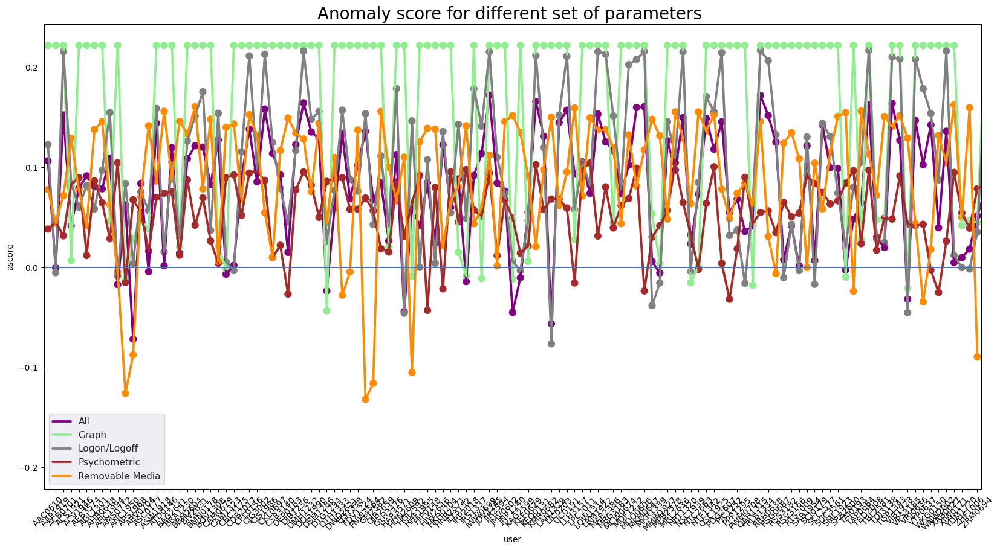

In [162]:
f, ax = plt.subplots(figsize = (20,10))
x_col='user'
y_col = 'ascore'
sns.set_theme(style="darkgrid")
sns.pointplot(ax=ax,x=x_col,y=y_col,data=all_parameters_result,color='purple')
sns.pointplot(ax=ax,x=x_col,y=y_col,data=graph_result,color='lightgreen')
sns.pointplot(ax=ax,x=x_col,y=y_col,data=user_log_result,color='grey')
sns.pointplot(ax=ax,x=x_col,y=y_col,data=psychometric_result,color='brown')
sns.pointplot(ax=ax,x=x_col,y=y_col,data=device_file_full_result,color='darkorange')

ax.legend(handles=ax.lines[::len(all_parameters_result)+1], labels=["All","Graph","Logon/Logoff","Psychometric","Removable Media"])
#ax.set_xtickslabels(rotation = 45)
ax.axhline(0, ls='-')
ax.set_title('Anomaly score for different set of parameters ', size = 20)
plt.rcParams["axes.labelsize"] = 25
plt.xticks(rotation = 45, fontsize = 10)
plt.yticks(fontsize = 10)
plt.show()

## User-pc node degree relationship graph (SNA) - Bar chart Anomaly Visualization

Text(0.5, 1.0, 'PC count distribution of users')

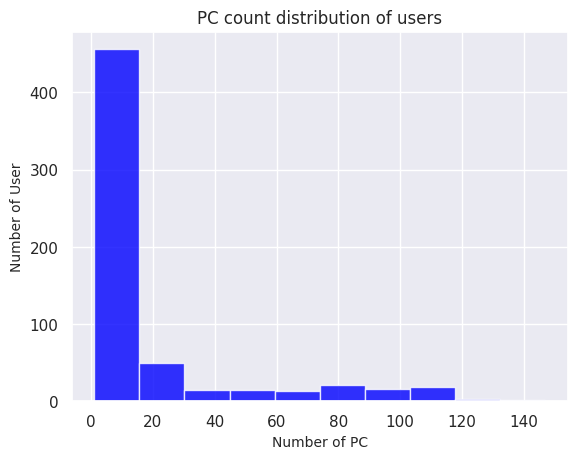

In [163]:
user_pc
# node degree from the graph analysis
plt.hist(user_pc.pc_count, alpha=0.8, color = 'blue');
plt.xlabel('Number of PC', size =10)
plt.ylabel('Number of User', size = 10)
plt.title('PC count distribution of users', size=12)

In [164]:
user_pc.loc[user_pc['pc_count'] > 40]

,user,pc_count
3,AAP1919,89
10,ACS1921,94
11,ACV1946,85
13,AEB3574,84
17,AEK3566,108
...,...,...
570,VRJ0636,101
579,WKG0150,64
587,WZG3563,105
594,YCL0650,83


## Visualization - File transfers per user

In [165]:
file_stats_new
import seaborn as sns

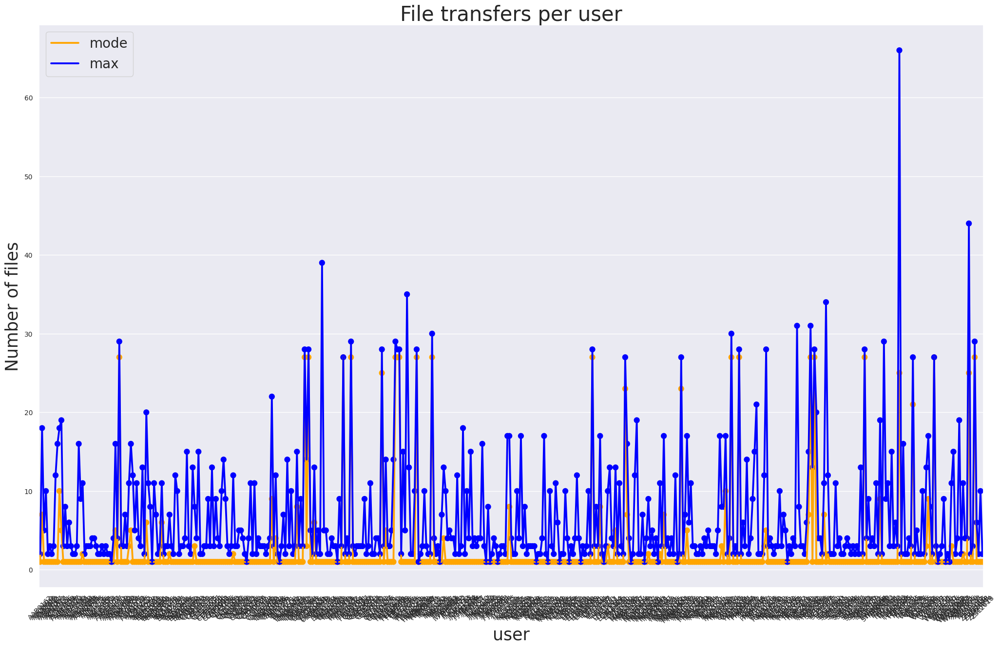

In [166]:
f, ax = plt.subplots(figsize = (25,15))
x_col='user'

sns.pointplot(ax=ax,x=x_col,y='mode_transfers_per_user',data=file_stats_new, color='orange')
sns.pointplot(ax=ax,x=x_col,y='max_transfers_per_user',data=file_stats_new,color='blue')

ax.legend(handles=ax.lines[::len(files_stats)+1], labels=["mode", "max"], fontsize = 20)

ax.set_title('File transfers per user', size = 30)
plt.rcParams["axes.labelsize"] = 25
plt.ylabel("Number of files")
plt.xticks(rotation = 45, fontsize = 10)
plt.yticks(fontsize = 10)
# plt.legend(fontsize=20)
plt.show()


# ISOLATION FOREST - VISUALALIZATION (JAN 17, 2021)

In [167]:
log_on_off_stats
device_full
psychometric_users_tidy
df_final


,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts,pc_count,O,C,E,A,N
0,AAB0162,27000,29220,27900,25200,66000,68400,67500,64800,1,45,36,33,15,33
1,AAC0610,587,86174,28800,32400,1227,62100,61200,54000,1,46,35,50,42,31
2,AAC0668,27900,30540,28860,25200,59700,62100,61200,57600,1,38,48,37,38,37
3,AAP1919,27000,59594,27900,25200,28807,61200,60900,54000,89,45,15,14,41,28
4,AAP1942,27000,49233,27900,32400,56700,57600,56700,54000,1,47,50,25,18,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
601,ZHM1979,33300,35820,34200,32400,61380,63900,63000,61200,1,35,45,11,39,26
602,ZJS2648,5050,86040,28920,32400,2210,84344,61200,50400,7,35,37,44,45,29
603,ZRM0694,1011,86027,26100,32400,13,86087,54900,46800,135,44,14,18,45,34
604,ZSL2618,33300,34980,33840,32400,65820,67500,66960,64800,1,45,15,27,25,23


In [168]:
user_log_result

,user,ascore
0,AAB0162,0.122733
1,AAC0610,-0.005122
2,AAC0668,0.215962
3,AAP1919,0.083906
4,AAP1942,0.060237
...,...,...
601,ZHM1979,0.082771
602,ZJS2648,0.016404
603,ZRM0694,-0.029516
604,ZSL2618,0.037192


In [169]:
device_file_full_result

,user,ascore
0,AAC0610,0.077839
1,AAP1919,0.044238
2,ACB0701,0.071959
3,ACS1921,0.129135
4,ACV1946,0.077049
...,...,...
116,XAB0627,0.104663
117,XIW0171,0.162502
118,YDM1720,0.049976
119,ZHF1006,0.159656


In [170]:
psychometric_result

,user,ascore
0,BTR2026,0.038389
1,SEM1983,0.045325
2,CLR1239,0.031681
3,KMB3003,0.082851
4,HDN2609,0.089698
...,...,...
601,QRR1242,0.076831
602,BXN0660,0.092508
603,BNT0663,0.059848
604,AJS0616,0.070655


In [171]:
graph_result

,user,ascore
0,AAB0162,0.221945
1,AAC0610,0.221945
2,AAC0668,0.221945
3,AAP1919,0.006812
4,AAP1942,0.221945
...,...,...
601,ZHM1979,0.221945
602,ZJS2648,-0.019617
603,ZRM0694,-0.177895
604,ZSL2618,0.221945


In [172]:
all_parameters_result

,user,ascore
0,AAB0162,0.106539
1,AAC0610,-0.000428
2,AAC0668,0.152371
3,AAP1919,0.041822
4,AAP1942,0.079325
...,...,...
601,ZHM1979,0.071439
602,ZJS2648,-0.001936
603,ZRM0694,-0.094705
604,ZSL2618,0.027583


array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

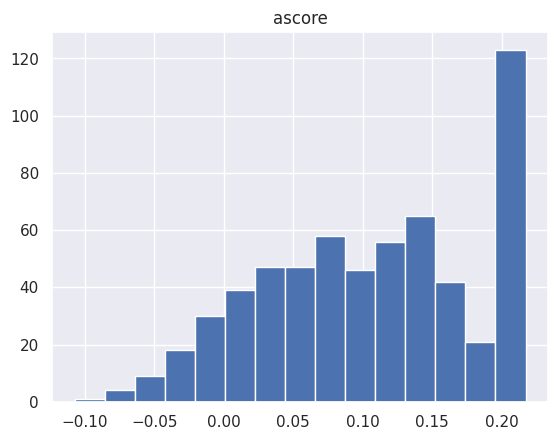

In [173]:
#user_log_result - hist
user_log_result.hist(bins = 15)

array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

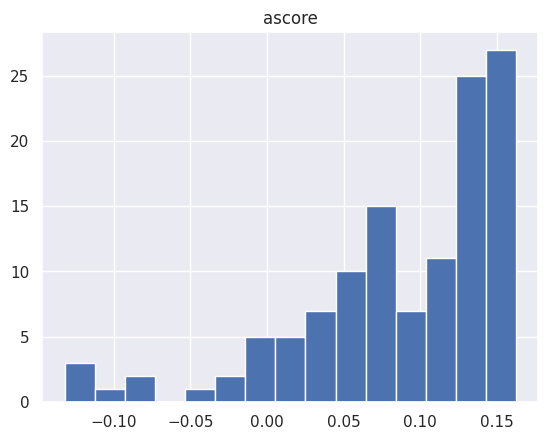

In [174]:
device_file_full_result.hist(bins = 15)

array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

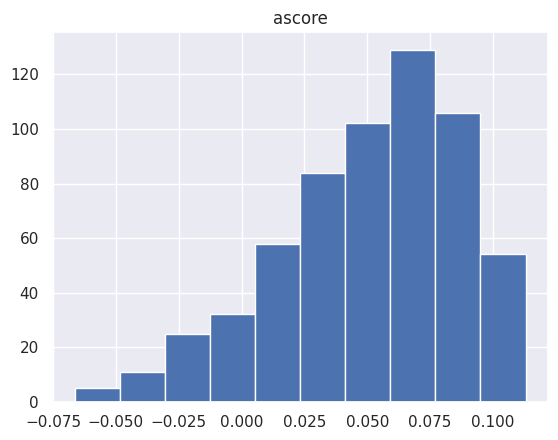

In [175]:
psychometric_result.hist()

array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

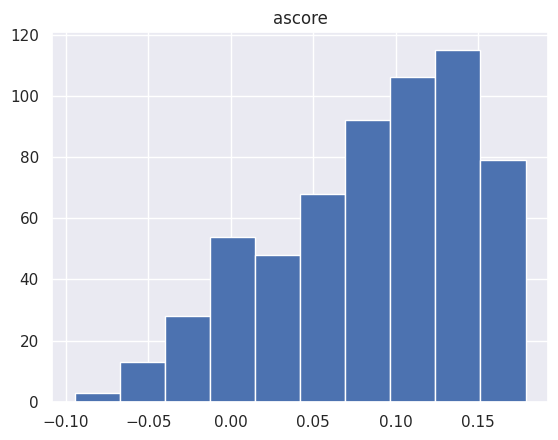

In [176]:
all_parameters_result.hist()

array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

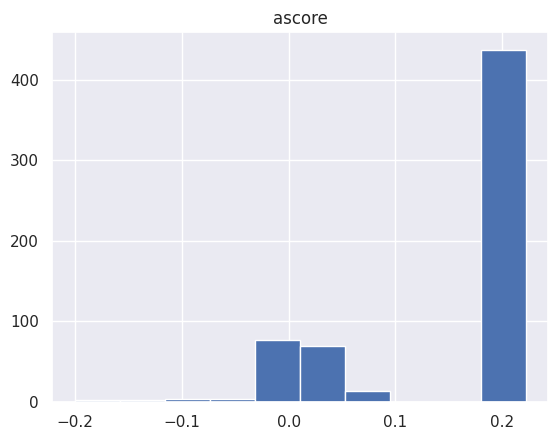

In [177]:
graph_result.hist()

# Visualizing anomalous users

## All parameters combined

array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

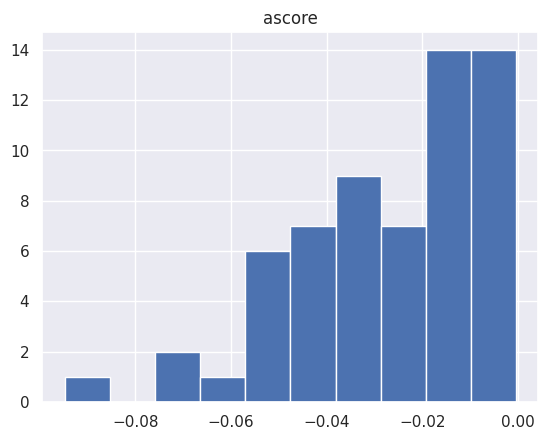

In [178]:
all_parameters_result.loc[all_parameters_result['ascore'] < 0].hist()

In [179]:
threat_users_all_params = all_parameters_result.loc[all_parameters_result['ascore'] < -0.065]
threat_users_all_params

,user,ascore
11,ACV1946,-0.071672
302,KAG0689,-0.068697
603,ZRM0694,-0.094705


In [180]:
all_parameters[all_parameters.user.isin(threat_users_all_params.user)]

,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts,pc_count,O,C,E,A,N
11,ACV1946,154,85609,27900,32400,929,84618,56700,46800,85,49,45,18,39,38
302,KAG0689,583,85832,26100,32400,287,84947,54900,46800,117,32,15,20,13,33
603,ZRM0694,1011,86027,26100,32400,13,86087,54900,46800,135,44,14,18,45,34


In [181]:
all_parameters.on_max_ts.median()

32730.0

## Device/File

array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

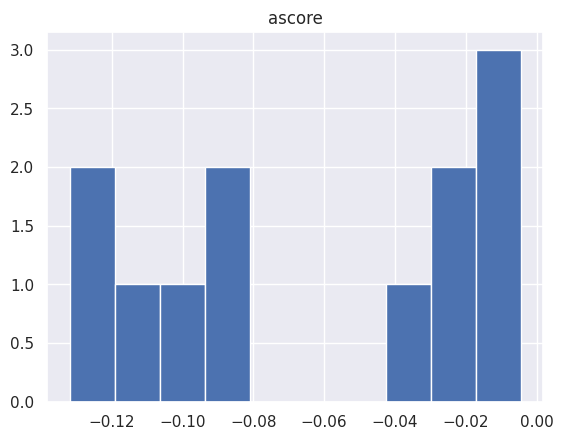

In [182]:
device_file_full_result.loc[device_file_full_result['ascore'] < 0].hist()

In [183]:
threat_users_device_file = device_file_full_result.loc[device_file_full_result['ascore'] <= -0]
threat_users_device_file

,user,ascore
9,AMS0712,-0.004541
10,ANC1950,-0.125835
11,APS1968,-0.087324
38,DWD2621,-0.027685
39,EJS1338,-0.004436
...,...,...
94,RSG0687,-0.006136
98,SAB1954,0.000000
104,TAJ0193,-0.023719
113,VYP0637,-0.034340


In [184]:
device_full[device_full.user.isin(threat_users_device_file.user)]

,user,con_min_ts,con_max_ts,con_mode_ts,con_mean_ts,dcon_min_ts,dcon_max_ts,dcon_mode_ts,dcon_mean_ts,file_mode,file_max
9,AMS0712,26301,56182,28064,36000,26301,56182,28064,36000,1,16
10,ANC1950,23157,79117,60701,39600,23157,79117,60701,39600,10,18
11,APS1968,31134,68591,32408,46800,31134,68591,32408,46800,5,19
38,DWD2621,33688,66353,49162,46800,33688,66353,49162,46800,1,4
39,EJS1338,28186,57227,56100,36000,28186,57227,56100,36000,5,16
...,...,...,...,...,...,...,...,...,...,...,...
94,RSG0687,25475,55576,25977,36000,25475,55576,25977,36000,1,10
98,SAB1954,23244,72781,53333,39600,23244,72781,53333,39600,1,2
104,TAJ0193,26422,69429,28303,46800,26422,69429,28303,46800,1,5
113,VYP0637,34195,61190,51893,46800,34195,61190,51893,46800,1,4


In [185]:
device_full.file_mode.mean()


1.6446280991735538

In [186]:
device_full.file_max.mean()


6.223140495867769

## Logon/logoff

array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

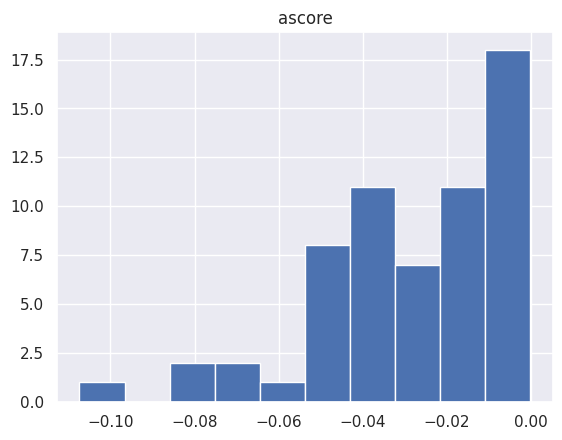

In [187]:
user_log_result
user_log_result.loc[user_log_result['ascore'] < 0].hist()

In [188]:
threat_users_log = user_log_result.loc[user_log_result['ascore'] <= -0.04]
threat_users_log

,user,ascore
46,ANC1950,-0.045699
65,BBT1948,-0.076274
111,CJF1934,-0.045174
134,CSS1313,-0.068679
163,DNV1964,-0.107373
...,...,...
458,PJC1252,-0.050223
532,SRS0129,-0.040743
536,TAB0684,-0.044963
543,TBL2581,-0.041612


In [189]:
log_on_off_stats[log_on_off_stats.user.isin(threat_users_log.user)]

,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts
46,ANC1950,319,86244,23400,25200,723,85675,62220,54000
65,BBT1948,1374,86208,23400,21600,50,86039,63000,54000
111,CJF1934,5209,85726,27900,32400,5396,85033,56700,46800
134,CSS1313,3270,79674,28680,25200,4975,85395,61920,57600
163,DNV1964,3398,82370,31500,28800,6698,72000,71100,61200
...,...,...,...,...,...,...,...,...,...
458,PJC1252,822,81127,26520,25200,21,86202,63420,57600
532,SRS0129,32400,66289,33300,39600,35850,66600,65700,61200
536,TAB0684,1848,85481,26100,32400,3352,82739,54900,46800
543,TBL2581,3376,85376,29940,36000,1675,85995,65700,57600


In [190]:
log_on_off_stats.on_max_ts.mean()

44295.841584158414

In [191]:
log_on_off_stats.on_max_ts.median()

32730.0

## User-pc interactions

array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

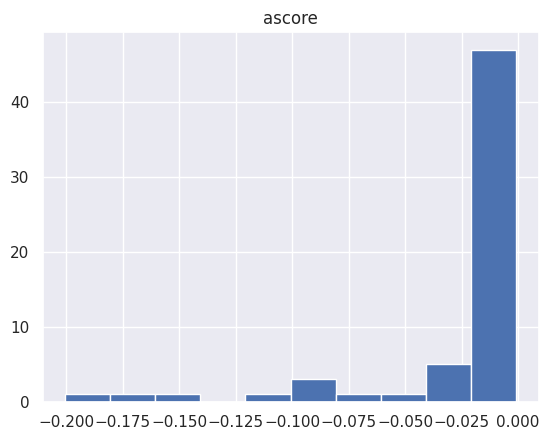

In [192]:
graph_result.loc[graph_result['ascore'] < 0].hist()

In [193]:
threat_graph = graph_result.loc[graph_result['ascore'] < -0.25]
threat_graph

,user,ascore


In [194]:
user_pc[user_pc.user.isin(threat_graph.user)]

,user,pc_count


In [195]:
user_pc.pc_count.mean()

15.902640264026402

In [196]:
user_pc.pc_count.median()

1.0

## Psychometric

Can't rely on this. Use min threshold for every feature O C E A N!

array([[<Axes: title={'center': 'ascore'}>]], dtype=object)

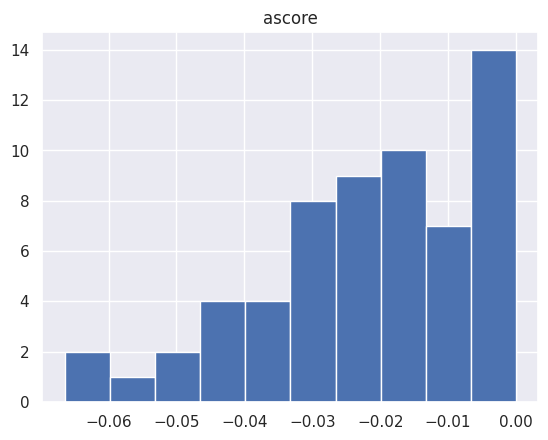

In [197]:
#psychometric_users_tidy
psychometric_result.loc[psychometric_result['ascore'] < 0].hist()

In [198]:
threat_psycho = psychometric_result.loc[psychometric_result['ascore'] <= -0.04]
threat_psycho

,user,ascore
49,KOM1306,-0.042830
125,WMA2016,-0.062975
161,DSM1286,-0.049097
310,DKP0671,-0.066408
326,QAH1315,-0.050669
335,DHC1989,-0.045122
354,CKP0659,-0.057590
442,NLP0155,-0.043907
586,DMG1298,-0.042966


In [199]:
psychometric_users_tidy[psychometric_users_tidy.user_id.isin(threat_psycho.user)]

,employee_name,user_id,O,C,E,A,N
49,Kiara Olympia Maxwell,KOM1306,18,13,11,22,20
125,Wanda Marah Allen,WMA2016,45,10,19,50,18
161,Daphne Sloane Mckee,DSM1286,14,13,34,12,19
310,Daryl Kai Parks,DKP0671,17,37,23,48,43
326,Quincy Alfreda Huffman,QAH1315,13,34,48,10,32
335,Dolan Hu Carlson,DHC1989,47,50,31,10,23
354,Calista Karen Powell,CKP0659,15,10,42,44,18
442,Naomi Liberty Pace,NLP0155,10,11,18,19,21
586,Daphne Melinda Gross,DMG1298,10,21,15,37,20


In [200]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = "all"

psychometric_users_tidy.N.max()
psychometric_users_tidy.N.min()
psychometric_users_tidy.N.mean()


29.475247524752476

In [201]:
log_on_off_stats

,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts
0,AAB0162,27000,29220,27900,25200,66000,68400,67500,64800
1,AAC0610,587,86174,28800,32400,1227,62100,61200,54000
2,AAC0668,27900,30540,28860,25200,59700,62100,61200,57600
3,AAP1919,27000,59594,27900,25200,28807,61200,60900,54000
4,AAP1942,27000,49233,27900,32400,56700,57600,56700,54000
...,...,...,...,...,...,...,...,...,...
601,ZHM1979,33300,35820,34200,32400,61380,63900,63000,61200
602,ZJS2648,5050,86040,28920,32400,2210,84344,61200,50400
603,ZRM0694,1011,86027,26100,32400,13,86087,54900,46800
604,ZSL2618,33300,34980,33840,32400,65820,67500,66960,64800


In [202]:
log_on_off_stats_extract = log_on_off_stats[['user', 'on_min_ts', 'on_max_ts']]

In [203]:
log_on_off_stats_extract

,user,on_min_ts,on_max_ts
0,AAB0162,27000,29220
1,AAC0610,587,86174
2,AAC0668,27900,30540
3,AAP1919,27000,59594
4,AAP1942,27000,49233
...,...,...,...
601,ZHM1979,33300,35820
602,ZJS2648,5050,86040
603,ZRM0694,1011,86027
604,ZSL2618,33300,34980


In [204]:
log_on_off_stats_extract_input = log_on_off_stats_extract.drop(['user'], axis = 1)
log_on_off_stats_extract_input

,on_min_ts,on_max_ts
0,27000,29220
1,587,86174
2,27900,30540
3,27000,59594
4,27000,49233
...,...,...
601,33300,35820
602,5050,86040
603,1011,86027
604,33300,34980


In [205]:
forest = IsolationForest(bootstrap=False, contamination=0.05, max_features=1.0,
        max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
        verbose=0)
forest.fit(log_on_off_stats_extract_input)

/opt/conda/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names
  warnings.warn(


IsolationForest(contamination=0.05, n_jobs=1)

In [206]:
# Anomaly score
log_on_off_stats_extract_input_ascore = forest.decision_function(log_on_off_stats_extract_input)
log_on_off_stats_extract_input_ascore[:10]

array([ 0.1948952 ,  0.06805101,  0.24959012,  0.14817292,  0.12423521,
        0.08533938,  0.07699516,  0.16172552,  0.17839692, -0.06797803])

In [207]:
log_on_off_stats_extract_input_result = pd.DataFrame()

log_on_off_stats_extract_input_result['user'] = log_on_off_stats_extract['user']
log_on_off_stats_extract_input_result['ascore'] = log_on_off_stats_extract_input_ascore
log_on_off_stats_extract_input_result

,user,ascore
0,AAB0162,0.194895
1,AAC0610,0.068051
2,AAC0668,0.249590
3,AAP1919,0.148173
4,AAP1942,0.124235
...,...,...
601,ZHM1979,0.061476
602,ZJS2648,-0.049276
603,ZRM0694,0.081873
604,ZSL2618,0.085721


In [209]:
data_merged = log_on_off_stats_extract_input_result.merge(log_on_off_stats_extract, how = 'inner')
data_merged
data_merged.to_csv('/kaggle/working/datamerged.csv')

,user,ascore,on_min_ts,on_max_ts
0,AAB0162,0.194895,27000,29220
1,AAC0610,0.068051,587,86174
2,AAC0668,0.249590,27900,30540
3,AAP1919,0.148173,27000,59594
4,AAP1942,0.124235,27000,49233
...,...,...,...,...
601,ZHM1979,0.061476,33300,35820
602,ZJS2648,-0.049276,5050,86040
603,ZRM0694,0.081873,1011,86027
604,ZSL2618,0.085721,33300,34980


In [210]:
log_on_off_stats_extract_input_result.loc[log_on_off_stats_extract_input_result['ascore'] < 0]

,user,ascore
9,ACB0701,-0.067978
15,AEH0187,-0.009054
111,CJF1934,-0.052759
134,CSS1313,-0.092106
137,CTM1961,-0.019101
...,...,...
533,SSR1962,-0.001230
543,TBL2581,-0.017399
577,WJC2637,-0.031725
585,WSE1949,-0.053745


In [211]:
log_on_off_stats

,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts
0,AAB0162,27000,29220,27900,25200,66000,68400,67500,64800
1,AAC0610,587,86174,28800,32400,1227,62100,61200,54000
2,AAC0668,27900,30540,28860,25200,59700,62100,61200,57600
3,AAP1919,27000,59594,27900,25200,28807,61200,60900,54000
4,AAP1942,27000,49233,27900,32400,56700,57600,56700,54000
...,...,...,...,...,...,...,...,...,...
601,ZHM1979,33300,35820,34200,32400,61380,63900,63000,61200
602,ZJS2648,5050,86040,28920,32400,2210,84344,61200,50400
603,ZRM0694,1011,86027,26100,32400,13,86087,54900,46800
604,ZSL2618,33300,34980,33840,32400,65820,67500,66960,64800


In [212]:
all_parameters

,user,on_min_ts,on_max_ts,on_mode_ts,on_mean_ts,off_min_ts,off_max_ts,off_mode_ts,off_mean_ts,pc_count,O,C,E,A,N
0,AAB0162,27000,29220,27900,25200,66000,68400,67500,64800,1,45,36,33,15,33
1,AAC0610,587,86174,28800,32400,1227,62100,61200,54000,1,46,35,50,42,31
2,AAC0668,27900,30540,28860,25200,59700,62100,61200,57600,1,38,48,37,38,37
3,AAP1919,27000,59594,27900,25200,28807,61200,60900,54000,89,45,15,14,41,28
4,AAP1942,27000,49233,27900,32400,56700,57600,56700,54000,1,47,50,25,18,36
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
601,ZHM1979,33300,35820,34200,32400,61380,63900,63000,61200,1,35,45,11,39,26
602,ZJS2648,5050,86040,28920,32400,2210,84344,61200,50400,7,35,37,44,45,29
603,ZRM0694,1011,86027,26100,32400,13,86087,54900,46800,135,44,14,18,45,34
604,ZSL2618,33300,34980,33840,32400,65820,67500,66960,64800,1,45,15,27,25,23


In [213]:
device_conn_stats_sec

,user,min_ts,max_ts,mode_ts,mean_ts
0,AAC0610,28389,74406,59787,43200
1,AAP1919,27211,60685,39279,39600
2,ACB0701,26210,55821,49918,36000
3,ACS1921,27407,60726,54615,39600
4,ACV1946,27439,79681,52886,39600
...,...,...,...,...,...
116,XAB0627,27705,66482,60594,43200
117,XIW0171,28035,61350,47576,39600
118,YDM1720,33465,63540,57987,43200
119,ZHF1006,27968,61689,40063,39600


<h1> Full Fledged Function

In [214]:
import numpy as np
import pandas as pd
import plotnine as p9
import matplotlib.pyplot as plt
import seaborn as sns


from matplotlib import pyplot
import seaborn




def anomaly_scatterplot(y,z, xlabtitle, ylabtitle):
    x = all_parameters['user']
    df = pd.concat([x, y, z], axis=1)
    df_matrix = df.drop(['user'], axis = 1)
    forest = IsolationForest(bootstrap=False, contamination=0.1, max_features=1.0,
        max_samples='auto', n_estimators=100, n_jobs=1, random_state=None,
        verbose=0)
    forest.fit(df_matrix)
    ascore = forest.decision_function(df_matrix)
    result = pd.DataFrame()
    result['user'] = x
    result_full = pd.merge(result, df, on = 'user')
    result_full['ascore'] = ascore
    result_full['Anomaly'] = np.where(result_full['ascore'] > 0, 1, -1)
    sns.set(rc={'figure.figsize':(12,10)})
    plot = sns.scatterplot(data=result_full, x = y, y = z, s = 125, hue = result_full['Anomaly'], palette=['red','green'])
    plt.xlabel(xlabtitle, fontsize = 18)
    plt.ylabel(ylabtitle, fontsize = 18)
    plt.legend(bbox_to_anchor=(1.01, 0.5),borderaxespad=0, title = "Anomaly" )
    plt.title('Anomaly Scatterplot', fontsize=20)
    plt.tight_layout()

    

    


    return plot
    
    


/opt/conda/lib/python3.10/site-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but IsolationForest was fitted with feature names


<Axes: title={'center': 'Anomaly Scatterplot'}, xlabel='Minimum Login Time (in sec)', ylabel='Minimum Logoff Time (in sec)'>

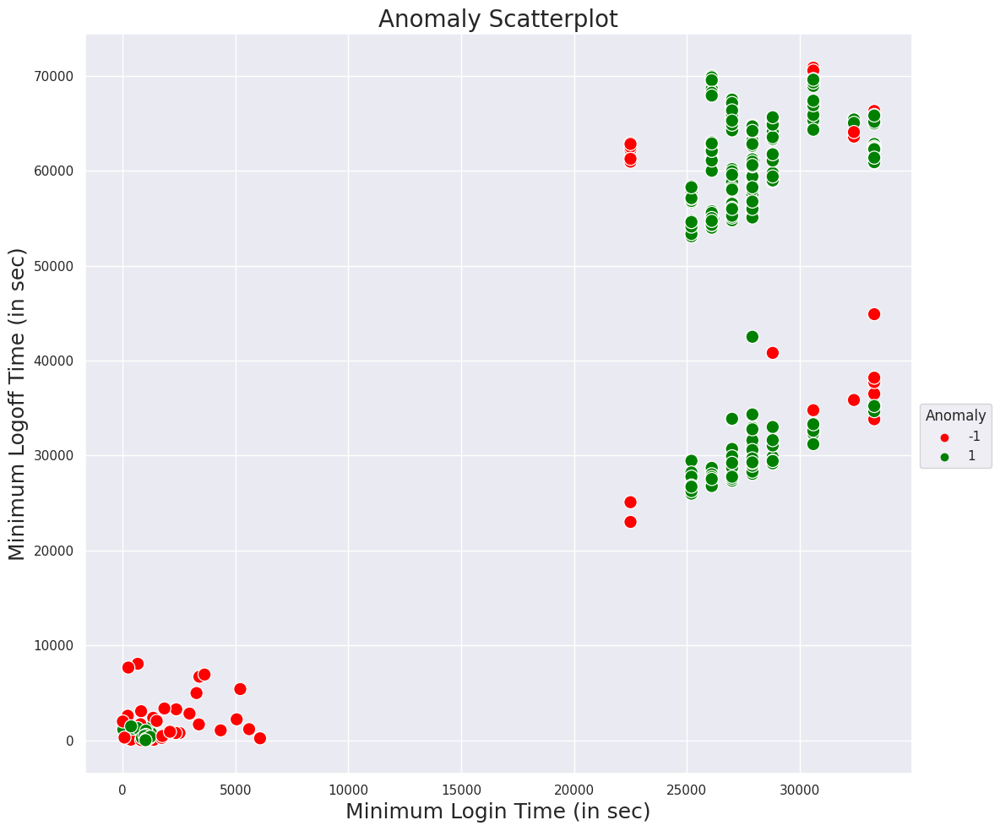

In [215]:
anomaly_scatterplot(all_parameters['on_min_ts'], all_parameters['off_min_ts'], 'Minimum Login Time (in sec)', 'Minimum Logoff Time (in sec)')